# PROVIDENCIA + ÑUÑOA - Spatial Representations - Representation learning comparisons with [paper 1 IMFD]( https://epjdatascience.springeropen.com/articles/10.1140/epjds/s13688-022-00374-2)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

/bin/bash: line 1: nvidia-smi: command not found


# Libraries

In [2]:
!pip install srai[all]
!pip install mplleaflet
!pip install keplergl
!pip install SpatialCluster
!pip install h3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of gtfs-kit to determine which version is compatible with other requirements. This could take a while.
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 52.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.7/82.7 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib.colors import ListedColormap
from matplotlib.ticker import MaxNLocator

import geopandas
import matplotlib.pyplot as plt
import contextily as cx
from folium import Figure,plugins
import io
from PIL import Image
import geopandas as gpd
from shapely.geometry import Point
import os
import mplleaflet
from keplergl import KeplerGl
import scipy
import h3

#models
from pytorch_lightning import seed_everything
from sklearn.cluster import KMeans


#To create embeddings
from srai.loaders import OSMOnlineLoader, OSMWayLoader, OSMPbfLoader
from srai.regionalizers import geocode_to_region_gdf, S2Regionalizer
from srai.plotting import plot_regions, plot_numeric_data
from srai.embedders import CountEmbedder, ContextualCountEmbedder,Hex2VecEmbedder, Highway2VecEmbedder
from srai.joiners import IntersectionJoiner
from srai.loaders.osm_loaders.filters import HEX2VEC_FILTER
from srai.neighbourhoods.h3_neighbourhood import H3Neighbourhood
from srai.regionalizers import H3Regionalizer, geocode_to_region_gdf

#SpatialCluster

from SpatialCluster.visualization.plotters import plot_map
from SpatialCluster.methods.DMoN import DMoN_Clustering
from SpatialCluster.methods.GMM import GMM_Clustering
from SpatialCluster.methods.KNN import KNN_Clustering
from SpatialCluster.methods.SOM import SOM_Clustering
from SpatialCluster.methods.TDI import TDI_Clustering

from SpatialCluster.preprocess.adjacency import adjacencyMatrix
from SpatialCluster.preprocess.data_format import attributes_with_zone_format

from SpatialCluster.metrics.ARI import ARI, ARI_matrix
from SpatialCluster.metrics.AMI import AMI, AMI_matrix

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)


In [4]:
SEED = 25
seed_everything(SEED)

INFO:lightning_fabric.utilities.seed:Seed set to 25


25

# I. GET DATA

In [5]:
study_area1 = geocode_to_region_gdf("Providencia, Chile")
study_area2 = geocode_to_region_gdf("Ñuñoa, Chile")

In [6]:
study_area = gpd.GeoDataFrame(pd.concat([study_area1, study_area2], ignore_index=True))
study_area = study_area.reset_index(drop=True)

In [7]:
regionalizer = H3Regionalizer(resolution=10, buffer=True)
regions_gdf_r_10 = regionalizer.transform(study_area)
plot_regions(regions_gdf_r_10, tiles_style="CartoDB positron")

# 1.  FEATURES + CREATE EMBEDDINGS

In [ ]:
query_amenities = {	"amenity" :["bar", "canteen", "fast_fodd", "pub",
                                "cafe","food_court", "restaurant",
                                "kindergarten", "music_school","school",
                                	"college", "library","university",
                                "bicycle_parking","bicycle_rental","bus_station",
                                "fuel","parking", "bank", "clinic", "dentist",
                                "doctors", "hospital","pharmacy","veterinary",
                                "social_facility","cinema","theatre","police",
                                "townhall"]}

query_buildings = {"building": ["apartments","house", "commercial",
                                "hotel","residential","dormitory",
                                "industrial","office","retail",
                                "supermarket","church","religious",
                                "hospital", "kindergarten", "train_station",
                                "university","parking", "bridge"]}

query_highway = {	"highway": ["motorway","roads","paths",
                              "primary","secondary","trunk",
                              "cycleway"]}

query_landuse = {"landuse": ["commercial", "education", "industrial",
                             "residential", "retail"]}

query_natural = {"natural" : ["water","beach","cliff", "wood"],
               "waterway": ["river","stream","canal","ditch"],
                 "leisure": ["park","playground"],
                 "place": ["square"]}

query_shop = {"shop" : ["bakery","convenience","food",
                        "general", "mall","supermarket",
                        "clothes", "second_hand", "beauty",
                        "hairdresser", "electronics"]}

### 1.1 Amenities features

In [ ]:
### get features
loader = OSMPbfLoader()
feat_query_amenities = loader.load(study_area, query_amenities)

### join regions with features
joiner = IntersectionJoiner()
joint_gdf_amenities_10 = joiner.transform(regions_gdf_r_10,feat_query_amenities)
joint_gdf_amenities_10

### create embeddings
neighbourhood = H3Neighbourhood(regions_gdf_r_10)
embedder = Hex2VecEmbedder([150, 75, 50])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_amenities_provnunoa_10 = embedder.fit_transform(
        regions_gdf_r_10,
        feat_query_amenities,
        joint_gdf_amenities_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10},
        batch_size=128)

h3_embeddings_amenities_provnunoa_10

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(
100%|██████████| 2532/2532 [00:00<00:00, 23168.55it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 19.3 K
---------------------------------------
19.3 K    Trainable params
0         Non-trainable params
19.3 K    Total params
0.077     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c556c6cffff,-0.043660,0.013285,-0.069657,-0.087059,0.093487,0.099817,-0.022857,-0.172244,0.115417,0.019756,...,0.041241,0.037775,-0.073796,-0.153558,0.115414,0.085736,0.111212,0.077847,-0.116379,-0.010457
8ab2c554d4c7fff,0.002963,-0.201050,-0.038193,0.107881,-0.159085,0.053935,0.012656,0.493509,0.117317,-0.055187,...,-0.134138,-0.094520,-0.056915,0.074821,0.008685,-0.237584,-0.135968,-0.028574,0.256010,0.214429
8ab2c556a05ffff,-0.043660,0.013285,-0.069657,-0.087059,0.093487,0.099817,-0.022857,-0.172244,0.115417,0.019756,...,0.041241,0.037775,-0.073796,-0.153558,0.115414,0.085736,0.111212,0.077847,-0.116379,-0.010457
8ab2c556b31ffff,-0.036076,-0.415687,-0.069042,0.160960,-0.054641,-0.220782,0.128978,0.278644,0.105412,0.225932,...,0.215248,-0.084651,-0.073346,-0.064845,0.272084,-0.296094,-0.093044,0.176800,0.367061,0.031559
8ab2c50b6b27fff,-0.043660,0.013285,-0.069657,-0.087059,0.093487,0.099817,-0.022857,-0.172244,0.115417,0.019756,...,0.041241,0.037775,-0.073796,-0.153558,0.115414,0.085736,0.111212,0.077847,-0.116379,-0.010457
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c556a2affff,-0.043927,-0.029650,-0.035374,-0.090819,0.195661,-0.027921,0.123152,-0.208847,0.029545,0.170359,...,0.185712,0.027047,-0.044448,-0.124612,0.171719,0.127563,0.138407,0.132309,-0.022168,-0.089734
8ab2c50b204ffff,0.002963,-0.201050,-0.038193,0.107881,-0.159085,0.053935,0.012656,0.493509,0.117317,-0.055187,...,-0.134138,-0.094520,-0.056915,0.074821,0.008685,-0.237584,-0.135968,-0.028574,0.256010,0.214429
8ab2c5549857fff,0.168753,0.157419,0.093976,-0.076610,-0.056858,0.325431,-0.295688,-0.276087,0.073089,0.028775,...,-0.213008,-0.008481,0.200347,-0.162955,0.175979,0.047098,-0.204755,-0.130802,-0.160258,-0.116903


In [ ]:
h3_embeddings_amenities_provnunoa_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_amenities_provnunoa_10.csv')


### 1.2   Building features

In [ ]:
### get features
loader = OSMPbfLoader()
feat_query_buildings = loader.load(study_area, query_buildings)

### join regions with features
joiner = IntersectionJoiner()
joint_gdf_buildings_10 = joiner.transform(regions_gdf_r_10,feat_query_buildings)
joint_gdf_buildings_10

### create embeddings
neighbourhood = H3Neighbourhood(regions_gdf_r_10)
embedder = Hex2VecEmbedder([150, 75, 50])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_buildings_provnunoa_10 = embedder.fit_transform(
        regions_gdf_r_10,
        feat_query_buildings,
        joint_gdf_buildings_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10},
        batch_size=128)

h3_embeddings_buildings_provnunoa_10

Output()

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Finished operation in 0:00:44

100%|██████████| 10896/10896 [00:00<00:00, 25195.13it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 16.9 K
---------------------------------------
16.9 K    Trainable params
0         Non-trainable params
16.9 K    Total params
0.068     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c540cdb7fff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126
8ab2c540a82ffff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126
8ab2c540dda7fff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126
8ab2c5423527fff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126
8ab2c5400727fff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c541542ffff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126
8ab2c542d8dffff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126
8ab2c540cb0ffff,0.028124,0.013562,-0.008986,-0.024602,0.060832,0.027589,0.114278,-0.011907,0.143504,-0.007305,...,0.003711,0.009765,0.111614,-0.026417,0.009330,0.039871,-0.080495,0.010007,-0.100168,0.037126


In [ ]:
h3_embeddings_buildings_provnunoa_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_buildings_provnunoa_10.csv')


### 1.3   Highway features

In [ ]:
### get features
loader = OSMPbfLoader()
feat_query_highway = loader.load(study_area, query_highway)

### join regions with features
joiner = IntersectionJoiner()
joint_gdf_highway_10 = joiner.transform(regions_gdf_r_10,feat_query_highway)
joint_gdf_highway_10

### create embeddings
neighbourhood = H3Neighbourhood(regions_gdf_r_10)
embedder = Hex2VecEmbedder([150, 75, 50])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_highway_provnunoa_10 = embedder.fit_transform(
        regions_gdf_r_10,
        feat_query_highway,
        joint_gdf_highway_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10},
        batch_size=128)

h3_embeddings_highway_provnunoa_10

Output()

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Finished operation in 0:00:39

100%|██████████| 10896/10896 [00:00<00:00, 24896.07it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.9 K
---------------------------------------
15.9 K    Trainable params
0         Non-trainable params
15.9 K    Total params
0.064     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c540cdb7fff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266
8ab2c540a82ffff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266
8ab2c540dda7fff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266
8ab2c5423527fff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266
8ab2c5400727fff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c541542ffff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266
8ab2c542d8dffff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266
8ab2c540cb0ffff,0.025814,0.020125,-0.083093,-0.044317,0.090052,0.072993,-0.110886,0.05482,0.029204,0.129676,...,0.004607,-0.003666,0.059156,-0.019588,0.071738,0.012696,-0.014181,-0.004061,-0.066909,-0.010266


In [ ]:
h3_embeddings_highway_provnunoa_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_highway_provnunoa_10.csv')


### 1.4 Landuse features

In [ ]:
### get features
loader = OSMPbfLoader()
feat_query_landuse = loader.load(study_area, query_landuse)
folium_map = plot_regions(study_area, colormap=["lightgray"], tiles_style="CartoDB positron")
#feat_query_landuse.explore(m=folium_map, color="pink")

### join regions with features
joiner = IntersectionJoiner()
joint_gdf_landuse_10 = joiner.transform(regions_gdf_r_10,feat_query_landuse)
joint_gdf_landuse_10

### create embeddings
neighbourhood = H3Neighbourhood(regions_gdf_r_10)
embedder = Hex2VecEmbedder([150, 75, 50])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_landuse_provnunoa_10 = embedder.fit_transform(
        regions_gdf_r_10,
        feat_query_landuse,
        joint_gdf_landuse_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10},
        batch_size=128)

h3_embeddings_landuse_provnunoa_10

Output()

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Finished operation in 0:00:46

100%|██████████| 10896/10896 [00:00<00:00, 25178.50it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.9 K
---------------------------------------
15.9 K    Trainable params
0         Non-trainable params
15.9 K    Total params
0.064     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c540cdb7fff,0.284397,-0.225258,0.104312,-0.082783,0.079758,-0.071868,-0.175327,0.626901,-0.410254,-0.179141,...,-0.294833,0.130335,0.185707,-0.226750,-0.122836,0.183485,-0.115131,-0.110764,-0.216049,-0.378870
8ab2c540a82ffff,-0.078477,0.172497,0.021185,-0.056973,-0.018715,0.113515,-0.006825,-0.450384,0.286161,-0.061672,...,0.005611,0.018305,0.016129,-0.013966,0.102222,0.046846,0.227457,-0.026809,0.161703,0.081139
8ab2c540dda7fff,-0.078337,-0.235817,-0.033620,0.078095,0.011126,-0.047458,0.055858,0.577227,-0.171732,0.082151,...,0.066684,0.086169,-0.092956,0.018939,-0.026375,-0.067472,-0.443391,-0.004842,-0.247465,0.046836
8ab2c5423527fff,-0.078477,0.172497,0.021185,-0.056973,-0.018715,0.113515,-0.006825,-0.450384,0.286161,-0.061672,...,0.005611,0.018305,0.016129,-0.013966,0.102222,0.046846,0.227457,-0.026809,0.161703,0.081139
8ab2c5400727fff,-0.078477,0.172497,0.021185,-0.056973,-0.018715,0.113515,-0.006825,-0.450384,0.286161,-0.061672,...,0.005611,0.018305,0.016129,-0.013966,0.102222,0.046846,0.227457,-0.026809,0.161703,0.081139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c541542ffff,-0.078477,0.172497,0.021185,-0.056973,-0.018715,0.113515,-0.006825,-0.450384,0.286161,-0.061672,...,0.005611,0.018305,0.016129,-0.013966,0.102222,0.046846,0.227457,-0.026809,0.161703,0.081139
8ab2c542d8dffff,-0.078337,-0.235817,-0.033620,0.078095,0.011126,-0.047458,0.055858,0.577227,-0.171732,0.082151,...,0.066684,0.086169,-0.092956,0.018939,-0.026375,-0.067472,-0.443391,-0.004842,-0.247465,0.046836
8ab2c540cb0ffff,0.028586,-0.293577,-0.090229,0.231112,0.092479,0.075031,-0.092104,0.565118,-0.396672,0.265702,...,0.067756,-0.259692,0.193337,0.106280,0.061542,0.064223,-0.376867,-0.033236,-0.094239,-0.027772


In [ ]:
h3_embeddings_landuse_provnunoa_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_landuse_provnunoa_10.csv')


### 1.5 Natural features

In [ ]:
### get features
loader = OSMPbfLoader()
feat_query_natural = loader.load(study_area, query_natural)

### join regions with features
joiner = IntersectionJoiner()
joint_gdf_natural_10 = joiner.transform(regions_gdf_r_10,feat_query_natural)
joint_gdf_natural_10

### create embeddings
neighbourhood = H3Neighbourhood(regions_gdf_r_10)
embedder = Hex2VecEmbedder([150, 75, 50])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_natural_provnunoa_10 = embedder.fit_transform(
        regions_gdf_r_10,
        feat_query_natural,
        joint_gdf_natural_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10},
        batch_size=128)

h3_embeddings_natural_provnunoa_10

Output()

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Finished operation in 0:00:50

100%|██████████| 10896/10896 [00:00<00:00, 25508.28it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 16.6 K
---------------------------------------
16.6 K    Trainable params
0         Non-trainable params
16.6 K    Total params
0.067     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c540cdb7fff,0.073721,-0.068040,-0.002328,0.036465,0.002019,0.058679,0.002490,0.007586,0.044647,-0.118916,...,0.031227,0.000316,-0.040897,-0.148844,-0.025294,-0.002086,-0.077715,-0.097647,-0.040840,0.047466
8ab2c540a82ffff,-0.165623,0.007703,0.152095,0.103135,0.001060,-0.116833,0.165476,-0.370550,0.412086,-0.332906,...,-0.153198,0.100882,-0.166870,-0.253788,0.085590,0.259927,-0.278655,-0.219400,0.123894,0.161635
8ab2c540dda7fff,0.073721,-0.068040,-0.002328,0.036465,0.002019,0.058679,0.002490,0.007586,0.044647,-0.118916,...,0.031227,0.000316,-0.040897,-0.148844,-0.025294,-0.002086,-0.077715,-0.097647,-0.040840,0.047466
8ab2c5423527fff,0.073721,-0.068040,-0.002328,0.036465,0.002019,0.058679,0.002490,0.007586,0.044647,-0.118916,...,0.031227,0.000316,-0.040897,-0.148844,-0.025294,-0.002086,-0.077715,-0.097647,-0.040840,0.047466
8ab2c5400727fff,0.073721,-0.068040,-0.002328,0.036465,0.002019,0.058679,0.002490,0.007586,0.044647,-0.118916,...,0.031227,0.000316,-0.040897,-0.148844,-0.025294,-0.002086,-0.077715,-0.097647,-0.040840,0.047466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c541542ffff,0.073721,-0.068040,-0.002328,0.036465,0.002019,0.058679,0.002490,0.007586,0.044647,-0.118916,...,0.031227,0.000316,-0.040897,-0.148844,-0.025294,-0.002086,-0.077715,-0.097647,-0.040840,0.047466
8ab2c542d8dffff,0.073721,-0.068040,-0.002328,0.036465,0.002019,0.058679,0.002490,0.007586,0.044647,-0.118916,...,0.031227,0.000316,-0.040897,-0.148844,-0.025294,-0.002086,-0.077715,-0.097647,-0.040840,0.047466
8ab2c540cb0ffff,0.122591,0.067830,-0.019003,-0.113569,0.008725,0.006902,-0.057854,0.104401,-0.337895,0.457271,...,-0.239687,-0.028525,0.306415,0.513001,-0.042650,-0.018821,0.177457,0.120466,-0.201209,-0.012401


In [ ]:
h3_embeddings_natural_provnunoa_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_natural_provnunoa_10.csv')


### 1.6 Shop features

In [ ]:
### get features
loader = OSMPbfLoader()
feat_query_shop = loader.load(study_area, query_shop)

### join regions with features
joiner = IntersectionJoiner()
joint_gdf_shop_10 = joiner.transform(regions_gdf_r_10,feat_query_shop)
joint_gdf_shop_10

### create embeddings
neighbourhood = H3Neighbourhood(regions_gdf_r_10)
embedder = Hex2VecEmbedder([150, 75, 50])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_shop_provnunoa_10 = embedder.fit_transform(
        regions_gdf_r_10,
        feat_query_shop,
        joint_gdf_shop_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10},
        batch_size=128)

h3_embeddings_shop_provnunoa_10

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(


Output()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Finished operation in 0:00:43

100%|██████████| 10896/10896 [00:00<00:00, 25344.37it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 16.6 K
---------------------------------------
16.6 K    Trainable params
0         Non-trainable params
16.6 K    Total params
0.067     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c540cdb7fff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666
8ab2c540a82ffff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666
8ab2c540dda7fff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666
8ab2c5423527fff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666
8ab2c5400727fff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c541542ffff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666
8ab2c542d8dffff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666
8ab2c540cb0ffff,0.00451,-0.015706,0.00299,-0.007842,0.027182,0.056739,-0.014768,-0.013162,0.034446,-0.018029,...,0.000836,-0.014375,0.006,-0.076422,-0.010378,-0.009771,0.007771,0.009159,-0.014106,-0.006666


In [ ]:
h3_embeddings_shop_provnunoa_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_shop_provnunoa_10.csv')


### 1.7 All features - filter hex2vec

In [8]:
### get features
loader = OSMPbfLoader()
provnunoa_features_gdf = loader.load(study_area, HEX2VEC_FILTER)
provnunoa_features_gdf
clipped_features_gdf = provnunoa_features_gdf.clip(study_area.geometry.unary_union)

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(
100%|███████████████████████████████████████| 309M/309M [00:00<00:00, 60.6GB/s]


Output()

Finished operation in 0:08:43

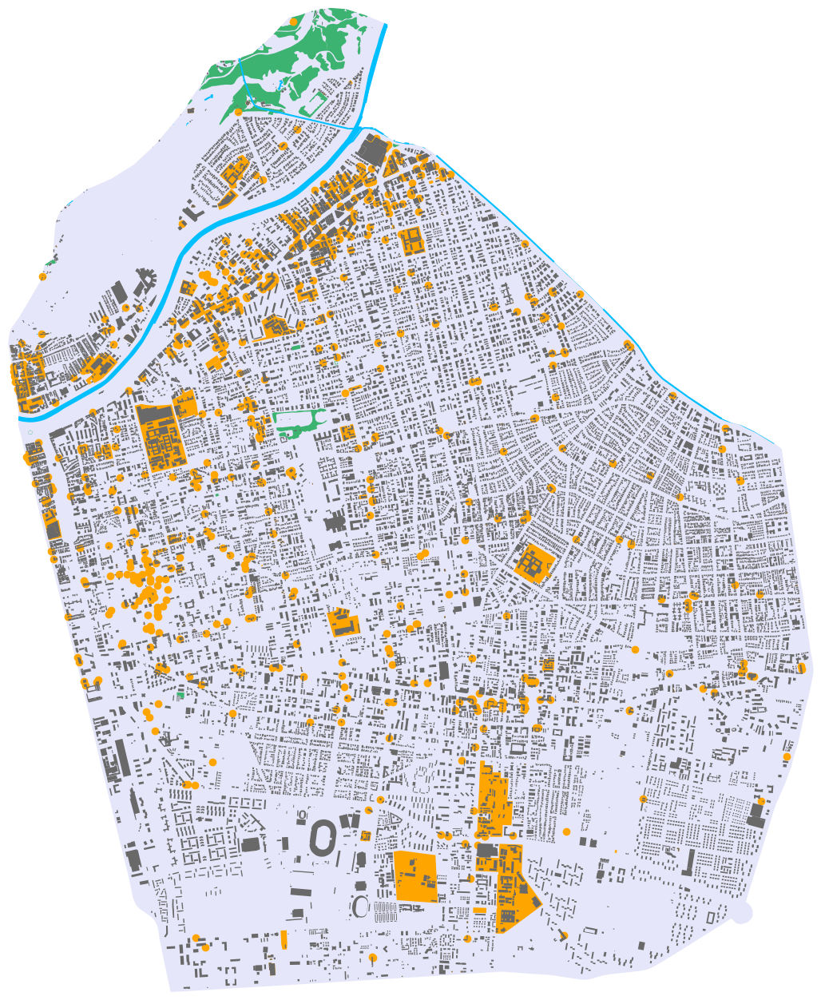

In [9]:
ax = study_area.plot(color="lavender", figsize=(16, 16))

# plot water
clipped_features_gdf.dropna(subset=["water", "waterway"], how="all").plot(
    ax=ax, color="deepskyblue"
)

# plot greenery
clipped_features_gdf[
    clipped_features_gdf["landuse"].isin(
        ["grass", "orchard", "flowerbed", "forest", "greenfield", "meadow"]
    )
].plot(ax=ax, color="mediumseagreen")

# plot amenities
clipped_features_gdf[
    clipped_features_gdf["amenity"].isin(
        ["restaurant", "veterinary", "food_court", "cafe", "hospital", "university",
        "police","childcare","social_centre"]
    )
].plot(ax=ax, color="orange")

# plot buildings
clipped_features_gdf.dropna(subset=["building"], how="all").plot(
    ax=ax, color="dimgray", markersize=0.1
)

xmin, ymin, xmax, ymax = study_area.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.set_axis_off()

In [ ]:
area = study_area

features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_r_10
joint = joiner.transform(regions, features)

embedder = Hex2VecEmbedder([150, 75, 50])
neighbourhood = H3Neighbourhood(regions_gdf_r_10)

#fit_transform
h3_embeddings_h2vec_filter_provnunoa_10 = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10},
          batch_size=128)
h3_embeddings_h2vec_filter_provnunoa_10


In [ ]:
h3_embeddings_h2vec_filter_provnunoa_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_provnunoa_10.csv')

#### Read embeddings and create lat and lon columns

with [150,75,50] configuration

In [ ]:
h3_embeddings_amenities_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_amenities_provnunoa_10.csv")
#find center of hex for visualization
h3_embeddings_amenities_10_geo = h3_embeddings_amenities_provnunoa_10.copy()
h3_embeddings_amenities_10_geo['lat'] = h3_embeddings_amenities_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_amenities_10_geo['lon'] = h3_embeddings_amenities_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])
h3_embeddings_amenities_10_geo

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c556c6cffff,-0.127391,-0.005461,0.045113,-0.147685,-0.024573,0.060443,0.071097,0.101688,0.025847,...,0.084651,-0.068582,-0.095645,0.022208,0.050219,0.019936,0.042912,0.034359,-33.409182,-70.611447
1,8ab2c554d4c7fff,-0.178895,0.055140,0.100695,0.150344,-0.018676,0.053551,0.173878,-0.086228,0.096028,...,-0.063678,0.081948,0.040684,-0.094045,0.071176,0.039067,-0.169758,0.225665,-33.462547,-70.623590
2,8ab2c556a05ffff,-0.127391,-0.005461,0.045113,-0.147685,-0.024573,0.060443,0.071097,0.101688,0.025847,...,0.084651,-0.068582,-0.095645,0.022208,0.050219,0.019936,0.042912,0.034359,-33.431019,-70.630360
3,8ab2c556b31ffff,-0.160433,0.165023,0.261399,0.190302,-0.008178,-0.062989,0.158075,-0.253689,-0.105663,...,-0.169462,0.228340,-0.013128,-0.503429,-0.147800,-0.059765,-0.164716,0.064435,-33.441968,-70.606568
4,8ab2c50b6b27fff,-0.127391,-0.005461,0.045113,-0.147685,-0.024573,0.060443,0.071097,0.101688,0.025847,...,0.084651,-0.068582,-0.095645,0.022208,0.050219,0.019936,0.042912,0.034359,-33.442330,-70.580891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,8ab2c556a2affff,-0.087034,0.008065,0.146818,-0.147887,0.012408,-0.018931,0.005070,0.087943,0.040416,...,0.050541,0.064336,-0.037795,-0.018769,0.011175,-0.005061,-0.027954,-0.081885,-33.435459,-70.629007
2528,8ab2c50b204ffff,-0.178895,0.055140,0.100695,0.150344,-0.018676,0.053551,0.173878,-0.086228,0.096028,...,-0.063678,0.081948,0.040684,-0.094045,0.071176,0.039067,-0.169758,0.225665,-33.469855,-70.589255
2529,8ab2c5549857fff,-0.000116,-0.005567,-0.052326,0.266709,-0.170812,0.245934,0.057472,-0.022273,-0.198451,...,0.024451,-0.190866,0.025310,-0.047808,-0.300550,0.025725,0.221202,-0.014992,-33.472455,-70.610339
2530,8ab2c5549937fff,-0.127391,-0.005461,0.045113,-0.147685,-0.024573,0.060443,0.071097,0.101688,0.025847,...,0.084651,-0.068582,-0.095645,0.022208,0.050219,0.019936,0.042912,0.034359,-33.467221,-70.612504


In [ ]:
h3_embeddings_buildings_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_buildings_provnunoa_10.csv")
#find center of hex for visualization
h3_embeddings_buildings_10_geo = h3_embeddings_buildings_provnunoa_10.copy()
h3_embeddings_buildings_10_geo['lat'] = h3_embeddings_buildings_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_buildings_10_geo['lon'] = h3_embeddings_buildings_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])
h3_embeddings_buildings_10_geo

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c556c6cffff,0.015986,-0.078169,-0.085897,-0.109931,0.144651,-0.084874,-0.110818,0.135066,-0.161443,...,-0.141824,0.017661,0.130574,0.060395,-0.305544,-0.269456,0.080141,0.168056,-33.409182,-70.611447
1,8ab2c554d4c7fff,0.015986,-0.078169,-0.085897,-0.109931,0.144651,-0.084874,-0.110818,0.135066,-0.161443,...,-0.141824,0.017661,0.130574,0.060395,-0.305544,-0.269456,0.080141,0.168056,-33.462547,-70.623590
2,8ab2c556a05ffff,0.015986,-0.078169,-0.085897,-0.109931,0.144651,-0.084874,-0.110818,0.135066,-0.161443,...,-0.141824,0.017661,0.130574,0.060395,-0.305544,-0.269456,0.080141,0.168056,-33.431019,-70.630360
3,8ab2c556b31ffff,0.208647,-0.093827,-0.227740,0.098518,-0.074898,-0.146186,0.258894,-0.137190,0.139895,...,0.059185,0.160854,-0.322110,0.111313,0.115017,0.105388,0.008019,-0.345502,-33.441968,-70.606568
4,8ab2c50b6b27fff,-0.158762,-0.071825,-0.021804,-0.222485,-0.058557,-0.143533,-0.059949,-0.029404,0.109264,...,-0.111047,-0.187138,-0.003860,0.236760,0.193966,0.239859,0.025547,-0.317232,-33.442330,-70.580891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,8ab2c556a2affff,0.510395,0.004612,-0.065590,0.248556,0.009562,0.179947,-0.177005,-0.067245,-0.283467,...,-0.002894,0.050733,0.058521,-0.096163,0.026477,0.029691,0.000288,0.025319,-33.435459,-70.629007
2528,8ab2c50b204ffff,0.015986,-0.078169,-0.085897,-0.109931,0.144651,-0.084874,-0.110818,0.135066,-0.161443,...,-0.141824,0.017661,0.130574,0.060395,-0.305544,-0.269456,0.080141,0.168056,-33.469855,-70.589255
2529,8ab2c5549857fff,-0.681021,-0.061435,0.433186,-0.071610,0.126466,-0.137554,0.544917,0.344732,0.348263,...,0.070010,-0.087425,-0.215810,0.145107,-0.358828,0.055782,-0.290329,0.386314,-33.472455,-70.610339
2530,8ab2c5549937fff,0.015986,-0.078169,-0.085897,-0.109931,0.144651,-0.084874,-0.110818,0.135066,-0.161443,...,-0.141824,0.017661,0.130574,0.060395,-0.305544,-0.269456,0.080141,0.168056,-33.467221,-70.612504


In [ ]:
h3_embeddings_highway_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_highway_provnunoa_10.csv")
#find center of hex for visualization
h3_embeddings_highway_10_geo = h3_embeddings_highway_provnunoa_10.copy()
h3_embeddings_highway_10_geo['lat'] = h3_embeddings_highway_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_highway_10_geo['lon'] = h3_embeddings_highway_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])
h3_embeddings_highway_10_geo

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c556c6cffff,0.039012,0.074332,0.028215,-0.120310,-0.095940,-0.033923,-0.027212,0.008244,0.009222,...,0.013513,-0.001151,-0.028804,0.107794,-0.044575,0.067686,-0.106438,-0.108801,-33.409182,-70.611447
1,8ab2c554d4c7fff,0.039012,0.074332,0.028215,-0.120310,-0.095940,-0.033923,-0.027212,0.008244,0.009222,...,0.013513,-0.001151,-0.028804,0.107794,-0.044575,0.067686,-0.106438,-0.108801,-33.462547,-70.623590
2,8ab2c556a05ffff,0.039012,0.074332,0.028215,-0.120310,-0.095940,-0.033923,-0.027212,0.008244,0.009222,...,0.013513,-0.001151,-0.028804,0.107794,-0.044575,0.067686,-0.106438,-0.108801,-33.431019,-70.630360
3,8ab2c556b31ffff,0.061800,-0.215716,-0.206667,-0.253021,0.000934,0.269675,0.052202,0.128752,0.041472,...,0.106515,0.009523,0.192019,-0.104657,-0.185192,-0.213332,0.312892,-0.029414,-33.441968,-70.606568
4,8ab2c50b6b27fff,0.039012,0.074332,0.028215,-0.120310,-0.095940,-0.033923,-0.027212,0.008244,0.009222,...,0.013513,-0.001151,-0.028804,0.107794,-0.044575,0.067686,-0.106438,-0.108801,-33.442330,-70.580891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,8ab2c556a2affff,-0.198938,-0.092451,0.093191,0.214151,0.170664,-0.199495,-0.152136,0.048473,-0.086808,...,-0.199105,0.221092,-0.158609,-0.006648,0.251310,0.057853,-0.488703,-0.024718,-33.435459,-70.629007
2528,8ab2c50b204ffff,0.039012,0.074332,0.028215,-0.120310,-0.095940,-0.033923,-0.027212,0.008244,0.009222,...,0.013513,-0.001151,-0.028804,0.107794,-0.044575,0.067686,-0.106438,-0.108801,-33.469855,-70.589255
2529,8ab2c5549857fff,0.039012,0.074332,0.028215,-0.120310,-0.095940,-0.033923,-0.027212,0.008244,0.009222,...,0.013513,-0.001151,-0.028804,0.107794,-0.044575,0.067686,-0.106438,-0.108801,-33.472455,-70.610339
2530,8ab2c5549937fff,0.039012,0.074332,0.028215,-0.120310,-0.095940,-0.033923,-0.027212,0.008244,0.009222,...,0.013513,-0.001151,-0.028804,0.107794,-0.044575,0.067686,-0.106438,-0.108801,-33.467221,-70.612504


In [ ]:
h3_embeddings_landuse_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_landuse_provnunoa_10.csv")
#find center of hex for visualization
h3_embeddings_landuse_10_geo = h3_embeddings_landuse_provnunoa_10.copy()
h3_embeddings_landuse_10_geo['lat'] = h3_embeddings_landuse_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_landuse_10_geo['lon'] = h3_embeddings_landuse_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])
h3_embeddings_landuse_10_geo

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c556c6cffff,0.046506,0.031801,0.209365,-0.256985,0.333896,-0.107688,0.121063,-0.336808,0.062870,...,0.345214,-0.191674,0.113822,0.382201,-0.109164,-0.102277,0.099796,0.005967,-33.409182,-70.611447
1,8ab2c554d4c7fff,-0.083424,-0.019276,-0.040090,0.039301,-0.032035,0.068297,-0.032138,0.184450,0.061550,...,-0.015010,0.077247,-0.086261,-0.202416,0.004406,0.188296,-0.005948,-0.130474,-33.462547,-70.623590
2,8ab2c556a05ffff,-0.083424,-0.019276,-0.040090,0.039301,-0.032035,0.068297,-0.032138,0.184450,0.061550,...,-0.015010,0.077247,-0.086261,-0.202416,0.004406,0.188296,-0.005948,-0.130474,-33.431019,-70.630360
3,8ab2c556b31ffff,-0.072163,0.030278,0.059185,-0.082945,-0.313590,-0.081920,-0.039092,-0.083653,0.013264,...,-0.225433,-0.157999,-0.021009,-0.244371,-0.036359,-0.361885,-0.313432,0.098082,-33.441968,-70.606568
4,8ab2c50b6b27fff,-0.083424,-0.019276,-0.040090,0.039301,-0.032035,0.068297,-0.032138,0.184450,0.061550,...,-0.015010,0.077247,-0.086261,-0.202416,0.004406,0.188296,-0.005948,-0.130474,-33.442330,-70.580891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,8ab2c556a2affff,-0.083424,-0.019276,-0.040090,0.039301,-0.032035,0.068297,-0.032138,0.184450,0.061550,...,-0.015010,0.077247,-0.086261,-0.202416,0.004406,0.188296,-0.005948,-0.130474,-33.435459,-70.629007
2528,8ab2c50b204ffff,-0.072163,0.030278,0.059185,-0.082945,-0.313590,-0.081920,-0.039092,-0.083653,0.013264,...,-0.225433,-0.157999,-0.021009,-0.244371,-0.036359,-0.361885,-0.313432,0.098082,-33.469855,-70.589255
2529,8ab2c5549857fff,0.352884,0.511545,-0.347893,-0.070866,0.325834,0.152962,0.022065,0.051008,-0.169071,...,-0.043391,0.450797,-0.223914,0.309218,0.191582,-0.207825,0.426853,0.463255,-33.472455,-70.610339
2530,8ab2c5549937fff,0.046506,0.031801,0.209365,-0.256985,0.333896,-0.107688,0.121063,-0.336808,0.062870,...,0.345214,-0.191674,0.113822,0.382201,-0.109164,-0.102277,0.099796,0.005967,-33.467221,-70.612504


In [ ]:
h3_embeddings_natural_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_natural_provnunoa_10.csv")
#find center of hex for visualization
h3_embeddings_natural_10_geo = h3_embeddings_natural_provnunoa_10.copy()
h3_embeddings_natural_10_geo['lat'] = h3_embeddings_natural_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_natural_10_geo['lon'] = h3_embeddings_natural_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])
h3_embeddings_natural_10_geo

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c556c6cffff,-0.048128,-0.017823,0.080791,-0.055895,-0.145596,0.033101,-0.195359,-0.011280,0.065993,...,0.066836,0.062721,0.048471,0.128637,-0.281449,0.156603,-0.247680,0.003987,-33.409182,-70.611447
1,8ab2c554d4c7fff,-0.048128,-0.017823,0.080791,-0.055895,-0.145596,0.033101,-0.195359,-0.011280,0.065993,...,0.066836,0.062721,0.048471,0.128637,-0.281449,0.156603,-0.247680,0.003987,-33.462547,-70.623590
2,8ab2c556a05ffff,0.072482,-0.074076,-0.096903,0.055062,0.005223,0.121820,0.094551,0.051981,0.003095,...,0.040991,-0.079261,-0.083762,-0.133855,0.119271,-0.114817,0.023984,-0.148122,-33.431019,-70.630360
3,8ab2c556b31ffff,0.072482,-0.074076,-0.096903,0.055062,0.005223,0.121820,0.094551,0.051981,0.003095,...,0.040991,-0.079261,-0.083762,-0.133855,0.119271,-0.114817,0.023984,-0.148122,-33.441968,-70.606568
4,8ab2c50b6b27fff,0.072482,-0.074076,-0.096903,0.055062,0.005223,0.121820,0.094551,0.051981,0.003095,...,0.040991,-0.079261,-0.083762,-0.133855,0.119271,-0.114817,0.023984,-0.148122,-33.442330,-70.580891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,8ab2c556a2affff,-0.048128,-0.017823,0.080791,-0.055895,-0.145596,0.033101,-0.195359,-0.011280,0.065993,...,0.066836,0.062721,0.048471,0.128637,-0.281449,0.156603,-0.247680,0.003987,-33.435459,-70.629007
2528,8ab2c50b204ffff,-0.048128,-0.017823,0.080791,-0.055895,-0.145596,0.033101,-0.195359,-0.011280,0.065993,...,0.066836,0.062721,0.048471,0.128637,-0.281449,0.156603,-0.247680,0.003987,-33.469855,-70.589255
2529,8ab2c5549857fff,0.072482,-0.074076,-0.096903,0.055062,0.005223,0.121820,0.094551,0.051981,0.003095,...,0.040991,-0.079261,-0.083762,-0.133855,0.119271,-0.114817,0.023984,-0.148122,-33.472455,-70.610339
2530,8ab2c5549937fff,0.072482,-0.074076,-0.096903,0.055062,0.005223,0.121820,0.094551,0.051981,0.003095,...,0.040991,-0.079261,-0.083762,-0.133855,0.119271,-0.114817,0.023984,-0.148122,-33.467221,-70.612504


In [ ]:
h3_embeddings_shop_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_shop_provnunoa_10.csv")
#find center of hex for visualization
h3_embeddings_shop_10_geo = h3_embeddings_shop_provnunoa_10.copy()
h3_embeddings_shop_10_geo['lat'] = h3_embeddings_shop_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_shop_10_geo['lon'] = h3_embeddings_shop_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])
h3_embeddings_shop_10_geo

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c556c6cffff,-0.015757,0.004199,0.018826,-0.029133,-0.009865,0.036065,0.019422,-0.010689,-0.021587,...,0.004094,0.050119,-0.000321,0.051195,0.020321,0.072888,0.028748,0.001971,-33.409182,-70.611447
1,8ab2c554d4c7fff,-0.015757,0.004199,0.018826,-0.029133,-0.009865,0.036065,0.019422,-0.010689,-0.021587,...,0.004094,0.050119,-0.000321,0.051195,0.020321,0.072888,0.028748,0.001971,-33.462547,-70.623590
2,8ab2c556a05ffff,-0.015757,0.004199,0.018826,-0.029133,-0.009865,0.036065,0.019422,-0.010689,-0.021587,...,0.004094,0.050119,-0.000321,0.051195,0.020321,0.072888,0.028748,0.001971,-33.431019,-70.630360
3,8ab2c556b31ffff,-0.047404,0.060691,0.019987,-0.026269,-0.050392,-0.140340,-0.079685,0.043970,0.042184,...,0.071671,-0.015360,-0.044380,0.030457,-0.075673,-0.068596,0.127500,-0.065040,-33.441968,-70.606568
4,8ab2c50b6b27fff,-0.015757,0.004199,0.018826,-0.029133,-0.009865,0.036065,0.019422,-0.010689,-0.021587,...,0.004094,0.050119,-0.000321,0.051195,0.020321,0.072888,0.028748,0.001971,-33.442330,-70.580891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,8ab2c556a2affff,-0.047404,0.060691,0.019987,-0.026269,-0.050392,-0.140340,-0.079685,0.043970,0.042184,...,0.071671,-0.015360,-0.044380,0.030457,-0.075673,-0.068596,0.127500,-0.065040,-33.435459,-70.629007
2528,8ab2c50b204ffff,-0.015757,0.004199,0.018826,-0.029133,-0.009865,0.036065,0.019422,-0.010689,-0.021587,...,0.004094,0.050119,-0.000321,0.051195,0.020321,0.072888,0.028748,0.001971,-33.469855,-70.589255
2529,8ab2c5549857fff,-0.015757,0.004199,0.018826,-0.029133,-0.009865,0.036065,0.019422,-0.010689,-0.021587,...,0.004094,0.050119,-0.000321,0.051195,0.020321,0.072888,0.028748,0.001971,-33.472455,-70.610339
2530,8ab2c5549937fff,-0.015757,0.004199,0.018826,-0.029133,-0.009865,0.036065,0.019422,-0.010689,-0.021587,...,0.004094,0.050119,-0.000321,0.051195,0.020321,0.072888,0.028748,0.001971,-33.467221,-70.612504


In [ ]:
h3_embeddings_h2vec_filter_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_provnunoa_10.csv")
#find center of hex for visualization
h3_embeddings_all_10_geo = h3_embeddings_h2vec_filter_provnunoa_10.copy()
h3_embeddings_all_10_geo['lat'] = h3_embeddings_all_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_all_10_geo['lon'] = h3_embeddings_all_10_geo["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])
h3_embeddings_all_10_geo

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c556c6cffff,0.281794,-0.039032,0.087802,-0.405329,0.028105,-0.167188,-0.575344,-0.222603,0.190793,...,-0.034166,-0.403862,-0.079102,0.292853,0.169908,0.406508,0.298395,-0.363695,-33.409182,-70.611447
1,8ab2c554d4c7fff,-0.137731,-0.062672,0.237711,-0.287558,-0.362584,0.178488,-0.126399,0.155727,0.046610,...,-0.201258,-0.204097,0.048194,-0.149216,-0.196227,-0.214817,-0.453418,0.191613,-33.462547,-70.623590
2,8ab2c556a05ffff,-0.013375,-0.539295,0.302231,-0.078465,-0.187075,-1.046789,0.243255,-0.655131,0.399396,...,-0.016593,-0.348266,0.427329,-0.114628,-0.034984,0.167605,-0.402044,-0.086252,-33.431019,-70.630360
3,8ab2c556b31ffff,0.060237,0.304068,0.163086,0.245769,0.319605,0.054293,0.191972,0.281826,-0.296106,...,0.400762,0.057827,-0.188160,-0.001928,0.368469,-0.105890,0.466928,0.105828,-33.441968,-70.606568
4,8ab2c50b6b27fff,-0.259751,0.097646,-0.115380,-0.156592,0.270157,-0.109551,0.267591,-0.170411,-0.091097,...,0.176314,-0.099376,-0.042719,0.262062,0.234865,0.081723,-0.006090,-0.051905,-33.442330,-70.580891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,8ab2c556a2affff,0.150961,-0.157794,0.279595,-0.311723,-0.297456,-0.243754,0.233684,-0.176222,0.407280,...,-0.249580,-0.255680,-0.071107,0.045930,-0.038038,-0.067838,0.213774,0.119837,-33.435459,-70.629007
2528,8ab2c50b204ffff,-0.306789,0.008970,0.085089,-0.133373,-0.056606,0.543775,-0.032211,0.329335,-0.257746,...,-0.133860,-0.098192,0.088487,-0.206558,-0.283067,-0.144116,-0.616177,0.307893,-33.469855,-70.589255
2529,8ab2c5549857fff,0.022039,-0.188293,-0.361923,0.655178,-0.313090,0.214378,-0.110568,0.288342,-0.006390,...,-0.379298,0.194331,-0.311814,0.063133,-0.726600,0.277103,0.152201,-0.206585,-33.472455,-70.610339
2530,8ab2c5549937fff,0.580747,0.591051,-0.095110,-0.130126,-0.008348,-0.277955,-0.046330,-0.321809,0.065751,...,0.057415,0.203747,0.133949,-0.619530,0.048884,0.327257,-0.071256,-0.215936,-33.467221,-70.612504


# II. SPATIAL CLUSTER



Embeddings creados con Hex2Vec embedder = [150,75,50] y Regionalizer H3, resolution = 10.

## PREPROCESAMIENTO DE EMBEDDINGS

Preprocesamiento

In [ ]:
def avg_vector(df):
    avg = []
    for col in df.columns:
        avg.append(df[col].mean())
    return np.array(avg)

In [ ]:
def distance(df, avg):
    dist = []
    matrix = np.array(df)
    for i in range(matrix.shape[0]):
        dist.append(np.linalg.norm(avg - matrix[i]))
    return np.array(dist)

#### 1.All features filter Hex2Vec

In [ ]:
features_position_all = h3_embeddings_all_10_geo[["lon", "lat"]]
features_X_all = h3_embeddings_all_10_geo.drop(columns=["region_id","lon", "lat"])
features_X_with_zone_all= h3_embeddings_all_10_geo.drop(columns=["lon", "lat"])
features_X_with_zone_all["dist"] = distance(features_X_with_zone_all.drop(columns=["region_id"]),
                                        avg_vector(features_X_with_zone_all.drop(columns=["region_id"])))

#### 2.Amenities

In [ ]:
features_position_ame = h3_embeddings_amenities_10_geo[["lon", "lat"]]
features_X_ame = h3_embeddings_amenities_10_geo.drop(columns=["region_id","lon", "lat"])
features_X_with_zone_ame = h3_embeddings_amenities_10_geo.drop(columns=["lon", "lat"])
features_X_with_zone_ame["dist"] = distance(features_X_with_zone_ame.drop(columns=["region_id"]),
                                        avg_vector(features_X_with_zone_ame.drop(columns=["region_id"])))

#### 3.Buildings

In [ ]:
features_position_bd = h3_embeddings_buildings_10_geo[["lon", "lat"]]
features_X_bd = h3_embeddings_buildings_10_geo.drop(columns=["region_id","lon", "lat"])
features_X_with_zone_bd = h3_embeddings_buildings_10_geo.drop(columns=["lon", "lat"])
features_X_with_zone_bd["dist"] = distance(features_X_with_zone_bd.drop(columns=["region_id"]),
                                        avg_vector(features_X_with_zone_bd.drop(columns=["region_id"])))

#### 4.Highway

In [ ]:
features_position_hig = h3_embeddings_highway_10_geo[["lon", "lat"]]
features_X_hig = h3_embeddings_highway_10_geo.drop(columns=["region_id","lon", "lat"])
features_X_with_zone_hig = h3_embeddings_highway_10_geo.drop(columns=["lon", "lat"])
features_X_with_zone_hig["dist"] = distance(features_X_with_zone_hig.drop(columns=["region_id"]),
                                        avg_vector(features_X_with_zone_hig.drop(columns=["region_id"])))

#### 5.Landuse

In [ ]:
features_position_land = h3_embeddings_landuse_10_geo[["lon", "lat"]]
features_X_land = h3_embeddings_landuse_10_geo.drop(columns=["region_id","lon", "lat"])
features_X_with_zone_land = h3_embeddings_landuse_10_geo.drop(columns=["lon", "lat"])
features_X_with_zone_land["dist"] = distance(features_X_with_zone_land.drop(columns=["region_id"]),
                                        avg_vector(features_X_with_zone_land.drop(columns=["region_id"])))

#### 6.Natural

In [ ]:
features_position_nat = h3_embeddings_natural_10_geo[["lon", "lat"]]
features_X_nat = h3_embeddings_natural_10_geo.drop(columns=["region_id","lon", "lat"])
features_X_with_zone_nat = h3_embeddings_natural_10_geo.drop(columns=["lon", "lat"])
features_X_with_zone_nat["dist"] = distance(features_X_with_zone_nat.drop(columns=["region_id"]),
                                        avg_vector(features_X_with_zone_nat.drop(columns=["region_id"])))

#### 7.Shop

In [ ]:
features_position_shp = h3_embeddings_shop_10_geo[["lon", "lat"]]
features_X_shp = h3_embeddings_shop_10_geo.drop(columns=["region_id","lon", "lat"])
features_X_with_zone_shp = h3_embeddings_shop_10_geo.drop(columns=["lon", "lat"])
features_X_with_zone_shp["dist"] = distance(features_X_with_zone_shp.drop(columns=["region_id"]),
                                        avg_vector(features_X_with_zone_shp.drop(columns=["region_id"])))

## MODELOS

## 0.Método del codo


Para encontrar el valor óptimo de k, utilizaremos una heurística llamada el método del codo, que consiste en graficar la varianza intra-clúster para distintos valores de K e identificar el punto "codo", donde la tasa de descenso de la varianza disminuye bruscamente, lo que sugiere que un mayor número de clúster no generará una mejora sustantiva en la métrica de ajuste.

 Idealmente, este número debiera coincidir con la cantidad de categorías reales de los datos. Sin embargo, es posible que existan clústers dentro de cada categoría, lo que haría que el número de centroides óptimo difiera de la cantidad de categorías indicada en la etiqueta de los datos.

Para el análisis utilizaremos la varianza intra-cluster como métrica de ajuste , que se obtiene al calcular, dentro de cada clúster, la suma del cuadrado de las distancias entre su centroide y cada uno de los puntos del clúster. Esta métrica es una medida de la variabilidad de las observaciones dentro de cada clúster y, en general, un clúster que tiene un valor pequeño es más compacto que un clúster que tiene uno grande. junto con la metodología de el codo para encontrar el número óptimo de centroides que capturan los distintos grupos en los datos.


Fuente: [Git curso progra de Hans](https://github.com/IIC2115/Syllabus/blob/master/Material%20de%20clases/Cap%C3%ADtulo%203/Notebooks/01%20-%20Modelos%20Predictivos.ipynb)


## 1.KMeans

#### 1.All features filter Hex2Vec

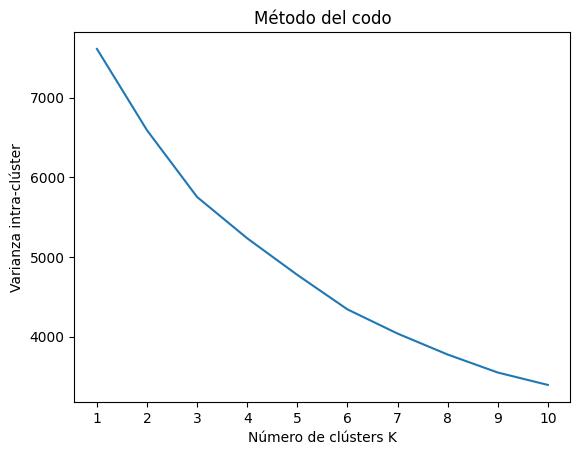

In [ ]:
h3_embeddings_h2vec_filter_provnunoa_10 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_provnunoa_10.csv',index_col = 0)
cluster_var = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(h3_embeddings_h2vec_filter_provnunoa_10[h3_embeddings_h2vec_filter_provnunoa_10.columns])
    cluster_var.append(kmeans.inertia_)

ax = plt.figure().gca()
plt.plot(range(1, 11), cluster_var)
plt.title('Método del codo')
plt.xlabel('Número de clústers K')
plt.ylabel('Varianza intra-clúster')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [ ]:
clusterizer = KMeans(n_clusters=6, random_state=SEED)
clusterizer.fit(h3_embeddings_h2vec_filter_provnunoa_10)

h3_embeddings_h2vec_filter_provnunoa_10["cluster"] = clusterizer.labels_
print(h3_embeddings_h2vec_filter_provnunoa_10['cluster'].value_counts())
h3_embeddings_h2vec_filter_provnunoa_10

plot_numeric_data(regions_gdf_r_10, "cluster", h3_embeddings_h2vec_filter_provnunoa_10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster
0    646
5    581
2    375
4    332
3    304
1    294
Name: count, dtype: int64


#### 2.Amenities

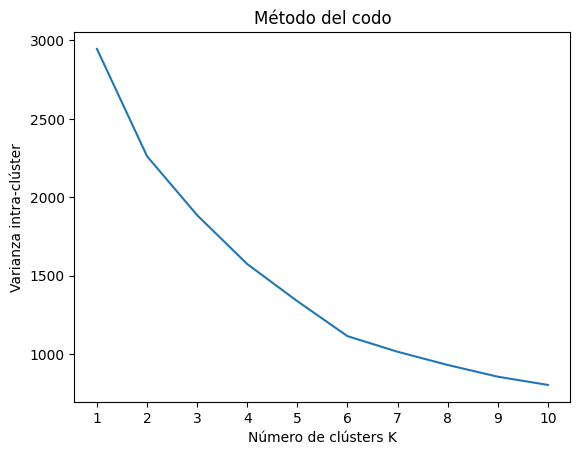

In [ ]:
h3_embeddings_amenities_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_amenities_provnunoa_10.csv",
                                               index_col = 0)
cluster_var = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(h3_embeddings_amenities_provnunoa_10[h3_embeddings_amenities_provnunoa_10.columns])
    cluster_var.append(kmeans.inertia_)

ax = plt.figure().gca()
plt.plot(range(1, 11), cluster_var)
plt.title('Método del codo')
plt.xlabel('Número de clústers K')
plt.ylabel('Varianza intra-clúster')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [ ]:
clusterizer = KMeans(n_clusters=6, random_state=SEED)
clusterizer.fit(h3_embeddings_amenities_provnunoa_10)

h3_embeddings_amenities_provnunoa_10["cluster"] = clusterizer.labels_
print(h3_embeddings_amenities_provnunoa_10['cluster'].value_counts())
h3_embeddings_amenities_provnunoa_10

plot_numeric_data(regions_gdf_r_10, "cluster", h3_embeddings_amenities_provnunoa_10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster
1    1477
2     318
4     308
5     219
0     135
3      75
Name: count, dtype: int64


#### 3.Buildings

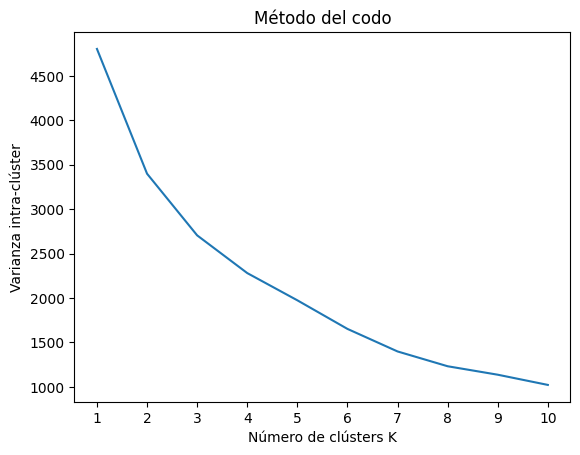

In [ ]:
h3_embeddings_buildings_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_buildings_provnunoa_10.csv",
                                               index_col = 0)
cluster_var = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(h3_embeddings_buildings_provnunoa_10[h3_embeddings_buildings_provnunoa_10.columns])
    cluster_var.append(kmeans.inertia_)

ax = plt.figure().gca()
plt.plot(range(1, 11), cluster_var)
plt.title('Método del codo')
plt.xlabel('Número de clústers K')
plt.ylabel('Varianza intra-clúster')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [ ]:
clusterizer = KMeans(n_clusters=7, random_state=SEED)
clusterizer.fit(h3_embeddings_buildings_provnunoa_10)

h3_embeddings_buildings_provnunoa_10["cluster"] = clusterizer.labels_
print(h3_embeddings_buildings_provnunoa_10['cluster'].value_counts())
h3_embeddings_buildings_provnunoa_10

plot_numeric_data(regions_gdf_r_10, "cluster", h3_embeddings_buildings_provnunoa_10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster
0    776
3    458
4    438
1    374
2    297
6    162
5     27
Name: count, dtype: int64


#### 4.Highway

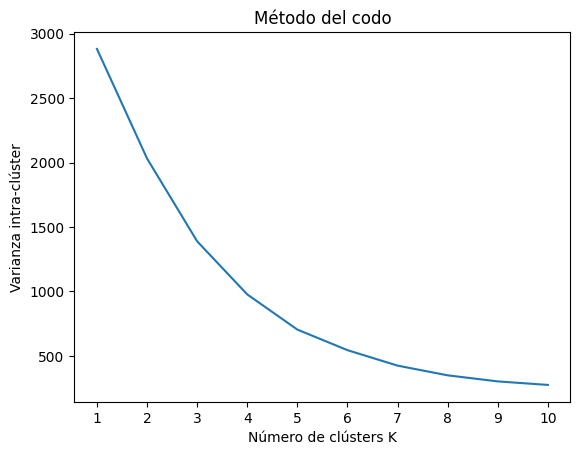

In [ ]:
h3_embeddings_highway_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_highway_provnunoa_10.csv",
                                               index_col = 0)

cluster_var = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(h3_embeddings_highway_provnunoa_10[h3_embeddings_highway_provnunoa_10.columns])
    cluster_var.append(kmeans.inertia_)

ax = plt.figure().gca()
plt.plot(range(1, 11), cluster_var)
plt.title('Método del codo')
plt.xlabel('Número de clústers K')
plt.ylabel('Varianza intra-clúster')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [ ]:
clusterizer = KMeans(n_clusters=5, random_state=SEED)
clusterizer.fit(h3_embeddings_highway_provnunoa_10)

h3_embeddings_highway_provnunoa_10["cluster"] = clusterizer.labels_
print(h3_embeddings_highway_provnunoa_10['cluster'].value_counts())
h3_embeddings_highway_provnunoa_10

plot_numeric_data(regions_gdf_r_10, "cluster", h3_embeddings_highway_provnunoa_10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster
1    1374
2     401
3     363
0     276
4     118
Name: count, dtype: int64


#### 5.Landuse

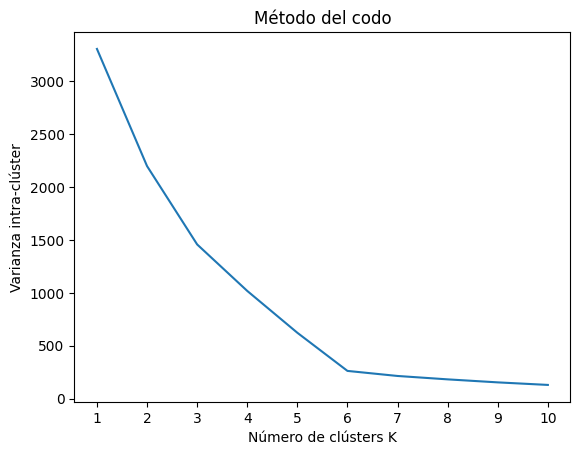

In [ ]:
h3_embeddings_landuse_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_landuse_provnunoa_10.csv",
                                               index_col = 0)

cluster_var = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(h3_embeddings_landuse_provnunoa_10[h3_embeddings_landuse_provnunoa_10.columns])
    cluster_var.append(kmeans.inertia_)

ax = plt.figure().gca()
plt.plot(range(1, 11), cluster_var)
plt.title('Método del codo')
plt.xlabel('Número de clústers K')
plt.ylabel('Varianza intra-clúster')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [ ]:
clusterizer = KMeans(n_clusters=6, random_state=SEED)
clusterizer.fit(h3_embeddings_landuse_provnunoa_10)

h3_embeddings_landuse_provnunoa_10["cluster"] = clusterizer.labels_
print(h3_embeddings_landuse_provnunoa_10['cluster'].value_counts())
h3_embeddings_landuse_provnunoa_10

plot_numeric_data(regions_gdf_r_10, "cluster", h3_embeddings_landuse_provnunoa_10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster
0    1621
1     287
4     237
2     207
3      93
5      87
Name: count, dtype: int64


#### 6.Natural

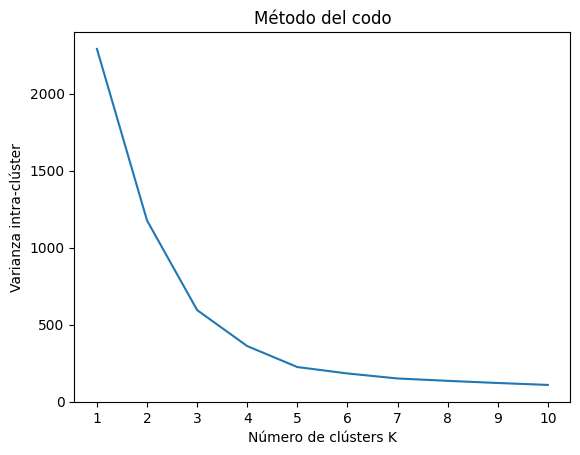

In [ ]:
h3_embeddings_natural_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_natural_provnunoa_10.csv",
                                               index_col = 0)

cluster_var = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(h3_embeddings_natural_provnunoa_10[h3_embeddings_natural_provnunoa_10.columns])
    cluster_var.append(kmeans.inertia_)

ax = plt.figure().gca()
plt.plot(range(1, 11), cluster_var)
plt.title('Método del codo')
plt.xlabel('Número de clústers K')
plt.ylabel('Varianza intra-clúster')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [ ]:
clusterizer = KMeans(n_clusters=6, random_state=SEED)
clusterizer.fit(h3_embeddings_natural_provnunoa_10)

h3_embeddings_natural_provnunoa_10["cluster"] = clusterizer.labels_
print(h3_embeddings_natural_provnunoa_10['cluster'].value_counts())
h3_embeddings_natural_provnunoa_10

plot_numeric_data(regions_gdf_r_10, "cluster", h3_embeddings_natural_provnunoa_10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster
0    1867
1     413
2     114
3      63
4      62
5      13
Name: count, dtype: int64


#### 7.Shop

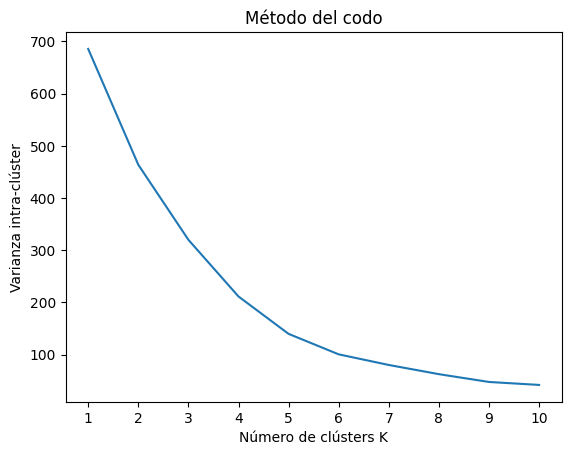

In [ ]:
h3_embeddings_shop_provnunoa_10 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_shop_provnunoa_10.csv",
                                               index_col = 0)
cluster_var = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(h3_embeddings_shop_provnunoa_10[h3_embeddings_shop_provnunoa_10.columns])
    cluster_var.append(kmeans.inertia_)

ax = plt.figure().gca()
plt.plot(range(1, 11), cluster_var)
plt.title('Método del codo')
plt.xlabel('Número de clústers K')
plt.ylabel('Varianza intra-clúster')
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.show()

In [ ]:
clusterizer = KMeans(n_clusters=5, random_state=SEED)
clusterizer.fit(h3_embeddings_shop_provnunoa_10)

h3_embeddings_shop_provnunoa_10["cluster"] = clusterizer.labels_
print(h3_embeddings_shop_provnunoa_10['cluster'].value_counts())
h3_embeddings_shop_provnunoa_10

plot_numeric_data(regions_gdf_r_10, "cluster", h3_embeddings_shop_provnunoa_10)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster
0    2175
3     264
1      60
2      32
4       1
Name: count, dtype: int64


## 2.GMM

Este método permite utilizar una distribución de probabilidad del modelo de mezcla gaussiana para realizar clustering.

**Parámetros**

* features_X: (Pandas DataFrame) Contiene los atributos de los datos (sin longitud ni latitud). GMM no trabaja con strings y se recomienda que los datos sean tipo float.

* features_position: (Pandas DataFrame) Contiene longitud y latitud de los datos.

* n_clusters: (int) Indica la cantidad de clusters que considerará el método para agrupar los datos. Por defecto: 4

* covariance_type: (string) Describe el tipo de parámetros de covarianza. Debe ser uno de los siguientes:

  - “full”: Cada componente tiene su propia matriz de covarianza general.

  - “tied”: Todos los componentes comparten la misma matriz de covarianza general.

  - “diag”: Cada componente tiene su propia covarianza de matriz diagonal.

  - “spherical”: Cada componente tiene su propia varianza individual.

Por defecto: “full”

* tol: (float) Umbral de tolerancia. Las iteraciones del proceso Expectation-Maximization (EM) pararán cuando la ganancia promedio de la cota inferior esté por debajo de este umbral. Por defecto: 1e-3

* reg_covar: (float) Parámetro no negativo para la regularización añadida a la diagonal de la matriz de covarianza. Permite asegurar que las matrices de covarianza sean positivas. Por defecto: 1e-6

**Retorno**

* GMM_areas_to_points: (dict) Para cada cluster guarda los puntos que pertenecen a este.

* GMM_clusters: (Numpy Array) Contiene los puntos etiquetados según el cluster al que fueron asignado.



#### 1.All features filter Hex2Vec

Modelo

6 clusters

## 3.DMON

Deep Modular Neural network es una red neuronal basada en grafos (GNN) usada en este caso para realizar clustering no supervisado, se enfoca en optimizar la modularidad, la cual corresponde a una medida usada para determinar la calidad del clustering.

**Parámetros**

* features_X: (Pandas DataFrame) Contiene los atributos de los datos (sin longitud ni latitud). DMoN no trabaja con strings y se recomienda que los datos sean tipo float.

* features_position: (Pandas DataFrame) Contiene longitud y latitud de los datos.

* A: (Numpy matrix) Matriz de adyacencia utilizada. En caso de que no se entregue una, se utilizará el método de adjacencyMatrix de SpatialCluster para crearla. Por defecto: None

* criteria: (string) Criterio que se usará para crear la matriz de adyacencia (k, r, rk). Por defecto: “k”

* r_max: (float) Radio máximo en metros que se utilizará para la creación de la matriz de adyacencia en caso de ser necesario. Por defecto: 300.0

* n_clusters: (int) Cantidad de clusters que considerará el método para agrupar los datos. Por defecto: 4

* reg: (float) Parámetro dentro del rango [0,1] que pondera la regularización de la función de pérdida para así evitar soluciones triviales como agrupar todos los datos en el mismo cluster. Por defecto: 1.0

* dropout: (float) Parámetro del rango [0,1] para evitar el sobreajuste a los datos (overfitting). Valores altos permitirán evitar más el sobreajuste, pero afectará el entrenamiento haciendo necesario más datos o más épocas (epochs). Por defecto: 0.0

* num_epochs: (int) Indica cuánto durará el entrenamiento. Valores muy altos podrían provocar sobreajuste. Por defecto: 500

* learning_rate: (float) Parámetro dentro del rango [0,1] que indica la tasa de ajustes que irá realizando la red en cada época. Valores muy altos permitirán un cambio más agresivo, lo cual puede provocar que no logre encontrar el punto óptimo. Valores bajos implicará que el aprendizaje será más lento por lo cuál necesitará más épocas y más datos para entrenar.

**Retorno**

* DMoN_areas_to_points: (dict) Para cada cluster guarda los puntos que pertenecen a este.

* DMoN_clusters: (Numpy Array) Contiene los puntos etiquetados según el cluster al que fueron asignado.

## 4.SOM (Self Organized Map)

**Self Organized Map** es un tipo de red neuronal artificial capaz de convertir relaciones estadísticas complejas y no lineales entre elementos de datos de alta dimensión en relaciones geométricas simples de baja dimensión. Este método aprovecha esta propiedad de SOM para realizar clustering.

**Parámetros**

* features_X: (Pandas DataFrame) Contiene los atributos de los datos (sin longitud ni latitud). SOM no trabaja con strings y se recomienda que los datos sean tipo float.

* features_position: (Pandas DataFrame) Contiene longitud y latitud de los datos.

* n_clusters: (int) Indica la cantidad de clusters que considerará el método para agrupar los datos. Por defecto: 4

* som_shape: (tupla de ints) Determina la topología de la red neuronal que usará SOM de la forma (cantidad_filas, cantidad_columnas). Por defecto: (3,3)

* sigma: (float) Dispersión de la función de vecindad, debe ser adecuada a la dimensión de SOM utilizada. Por defecto: 0.5

* learning_rate: (float) Parámetro dentro del rango [0,1] que corresponde a la cantidad de información inicial que se compartirá entre neuronas en cada iteración del proceso de entrenamiento de la red. Por defecto: 0.5

* num_iterations: (int) Cantidad de iteraciones que se realizarán en el proceso de entrenamiento. Por defecto: 100

**Retorno**

* SOM_areas_to_points: (dict) Para cada cluster guarda los puntos que pertenecen a este.

* SOM_clusters: (Numpy Array) Contiene los puntos etiquetados según el cluster al que fueron asignado.

# EVALUATING WITH ARI & AMI

2 matrices comparing these five maps.

The first matrix corresponds to the Adjusted Rand Index (ARI) measurement, while the second pertains to the Adjusted Mutual Information
(AMI) measurement.



### Evaluation All features

In [ ]:
A = adjacencyMatrix(features_position_land,
                    r = 300.0,
                    k = 5,
                    min_k = 2,
                    criteria = "k",
                    directed = True,
                    leafsize = 10)

In [ ]:
DMoN_areas_to_points, DMoN_clusters = DMoN_Clustering(features_X_all, features_position_all, A = A, criteria = "k", r_max = 300.0, n_clusters = 6, reg = 1.0, dropout = 0.0, num_epochs = 500, learning_rate = 0.001)
GMM_areas_to_points, GMM_clusters = GMM_Clustering(features_X_all, features_position_all, n_clusters = 6, covariance_type = "full", tol=1e-3, reg_covar=1e-6)
SOM_areas_to_points, SOM_clusters = SOM_Clustering(features_X_all, features_position_all, som_shape = (3,3), sigma=0.3, learning_rate=0.3, num_iterations = 100)
Kmeans_labels = KMeans(n_clusters=6, random_state=SEED).fit_predict(h3_embeddings_h2vec_filter_provnunoa_10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
area_to_clusterize = "PROVNUNOA"
features_to_clusterize = "features_X_all"
methods = ["DMoN_clusters", "GMM_clusters",  "SOM_clusters", "KMEANS_clusters"]
clusters = [DMoN_clusters, GMM_clusters,SOM_clusters, Kmeans_labels]
i = 0
for method in methods:
    gdf = features_position_all.copy()
    gdf["clusters"] = clusters[i]
    ax.set_title(method)
    plot_map(gdf, markersize=30, figsize=(12,8))#, path=f"/content/drive/MyDrive/UC-TESIS/mapas/PROVNUNOA/{method}_{features_to_clusterize}_{area_to_clusterize}.png")
    i += 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
clusterings_all_features = pd.DataFrame({
    "DMoN": DMoN_clusters,
    "GMM": GMM_clusters,
    "SOM": SOM_clusters,
    "KMEANS": Kmeans_labels
})
clusterings_all_features

,DMoN,GMM,SOM,KMEANS
0,5,5,3,3
1,4,3,2,1
2,5,1,1,2
3,3,2,0,0
4,1,0,0,5
...,...,...,...,...
2527,5,4,2,4
2528,4,3,2,1
2529,2,4,2,4
2530,2,1,0,2


#### ARI

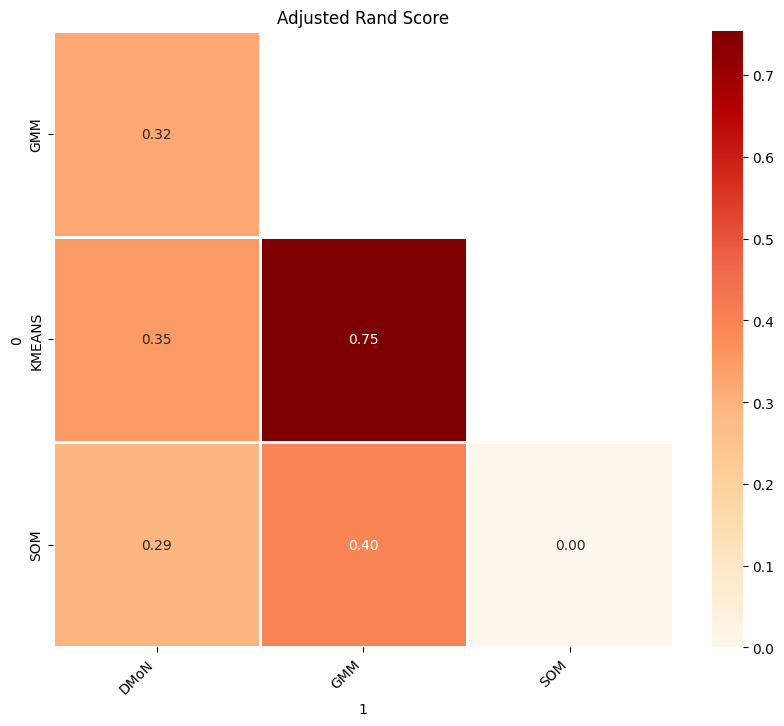

In [ ]:
ari_matr = ARI_matrix(clusterings_all_features, plot=True)

#### AMI

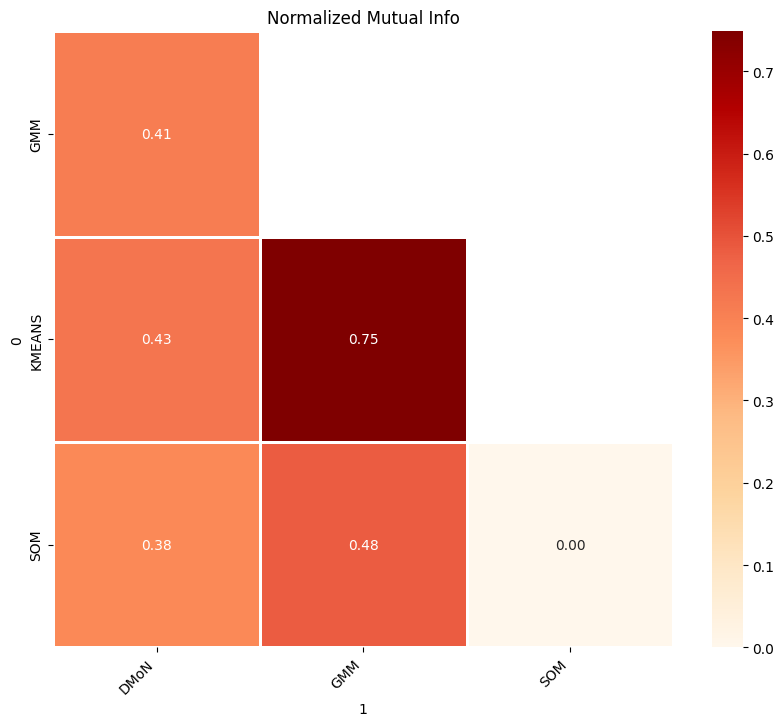

In [ ]:
ami_matr = AMI_matrix(clusterings_all_features, plot=True)

### Evaluation Amenities

Clustering

In [ ]:
DMoN_areas_to_points, DMoN_clusters = DMoN_Clustering(features_X_ame, features_position_ame, A = A, criteria = "k", r_max = 300.0, n_clusters = 6, reg = 1.0, dropout = 0.0, num_epochs = 500, learning_rate = 0.001)
GMM_areas_to_points, GMM_clusters = GMM_Clustering(features_X_ame, features_position_ame, n_clusters = 6, covariance_type = "full", tol=1e-3, reg_covar=1e-6)
SOM_areas_to_points, SOM_clusters = SOM_Clustering(features_X_ame, features_position_ame, som_shape = (3,3), sigma=0.3, learning_rate=0.3, num_iterations = 100)
Kmeans_labels = KMeans(n_clusters=6, random_state=SEED).fit_predict(h3_embeddings_amenities_provnunoa_10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Visualization

In [ ]:
area_to_clusterize = "PROVNUNOA"
features_to_clusterize = "features_X_ame"
methods = ["DMoN_clusters", "GMM_clusters",  "SOM_clusters", "KMEANS_clusters"]
clusters = [DMoN_clusters, GMM_clusters,SOM_clusters, Kmeans_labels]
i = 0
for method in methods:
    gdf = features_position_ame.copy()
    gdf["clusters"] = clusters[i]
    ax.set_title(method)
    plot_map(gdf, markersize=30, figsize=(12,8))#, path=f"/content/drive/MyDrive/UC-TESIS/mapas/PROVNUNOA/{method}_{features_to_clusterize}_{area_to_clusterize}.png")
    i += 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
clusterings_ame_features = pd.DataFrame({
    "DMoN": DMoN_clusters,
    "GMM": GMM_clusters,
    "SOM": SOM_clusters,
    "KMEANS": Kmeans_labels
})
clusterings_ame_features

,DMoN,GMM,SOM,KMEANS
0,5,0,1,0
1,4,2,2,1
2,3,0,1,0
3,4,2,2,1
4,2,0,1,0
...,...,...,...,...
2527,3,0,1,0
2528,4,2,2,1
2529,3,1,1,3
2530,5,0,1,0


#### ARI

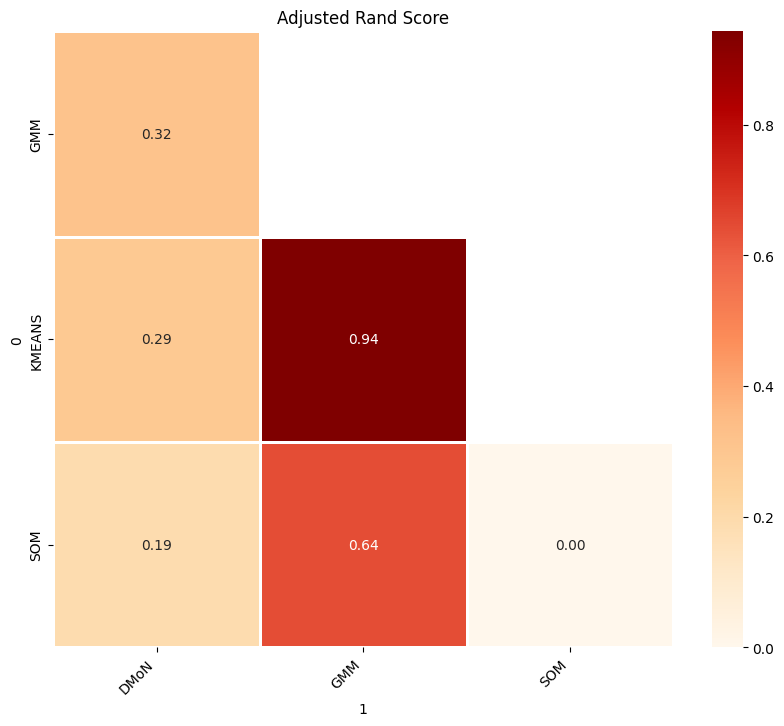

In [ ]:
ari_matr = ARI_matrix(clusterings_ame_features, plot=True)

#### AMI

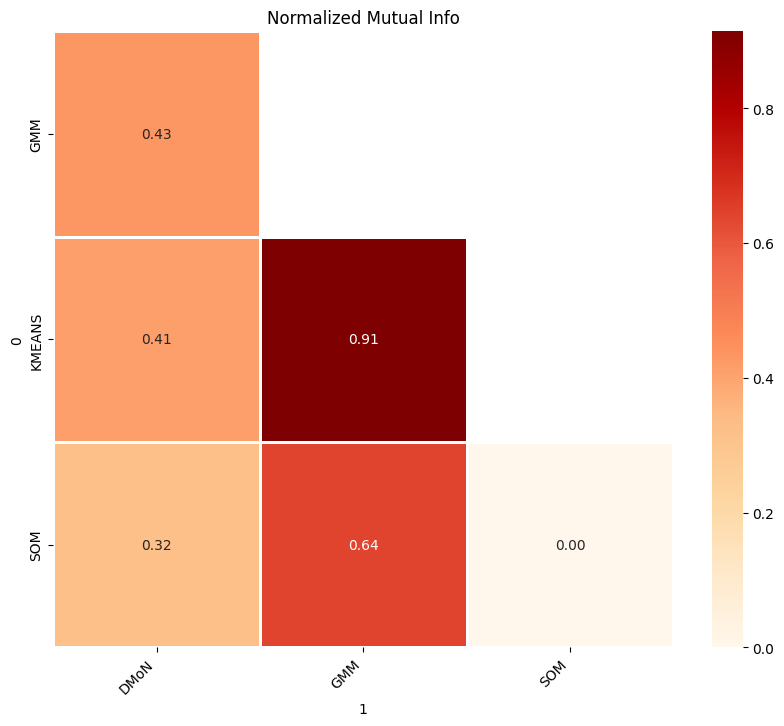

In [ ]:
ami_matr = AMI_matrix(clusterings_ame_features, plot=True)

### Evaluation Buildings

Clustering

In [ ]:
DMoN_areas_to_points, DMoN_clusters = DMoN_Clustering(features_X_bd, features_position_bd, A = A, criteria = "k", r_max = 300.0, n_clusters = 7, reg = 1.0, dropout = 0.0, num_epochs = 500, learning_rate = 0.001)
GMM_areas_to_points, GMM_clusters = GMM_Clustering(features_X_bd, features_position_bd, n_clusters = 7, covariance_type = "full", tol=1e-3, reg_covar=1e-6)
SOM_areas_to_points, SOM_clusters = SOM_Clustering(features_X_bd, features_position_bd, som_shape = (3,3), sigma=0.3, learning_rate=0.3, num_iterations = 100)
Kmeans_labels = KMeans(n_clusters=7, random_state=SEED).fit_predict(h3_embeddings_buildings_provnunoa_10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Visualization

In [ ]:
area_to_clusterize = "PROVNUNOA"
features_to_clusterize = "features_X_bd"
methods = ["DMoN_clusters", "GMM_clusters",  "SOM_clusters", "KMEANS_clusters"]
clusters = [DMoN_clusters, GMM_clusters,SOM_clusters, Kmeans_labels]
i = 0
for method in methods:
    gdf = features_position_bd.copy()
    gdf["clusters"] = clusters[i]
    ax.set_title(method)
    plot_map(gdf, markersize=30, figsize=(12,8))#, path=f"/content/drive/MyDrive/UC-TESIS/mapas/PROVNUNOA/{method}_{features_to_clusterize}_{area_to_clusterize}.png")
    i += 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
clusterings_bd_features = pd.DataFrame({
    "DMoN": DMoN_clusters,
    "GMM": GMM_clusters,
    "SOM": SOM_clusters,
    "KMEANS": Kmeans_labels
})
clusterings_bd_features

,DMoN,GMM,SOM,KMEANS
0,0,1,1,2
1,2,1,1,2
2,0,1,1,2
3,4,5,2,1
4,5,0,2,4
...,...,...,...,...
2527,1,4,0,5
2528,0,1,1,2
2529,6,3,3,3
2530,0,1,1,2


#### ARI

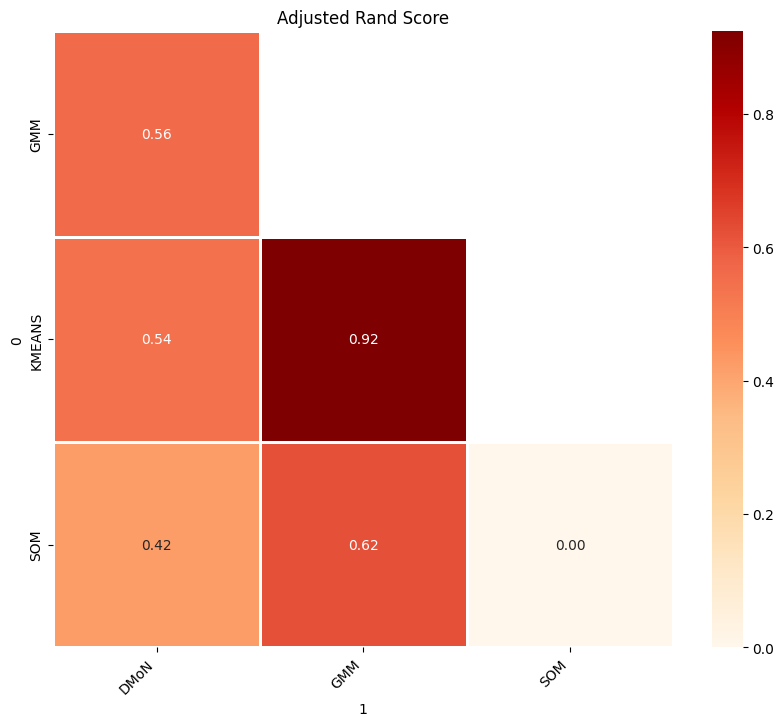

In [ ]:
ari_matr = ARI_matrix(clusterings_bd_features, plot=True)

#### AMI

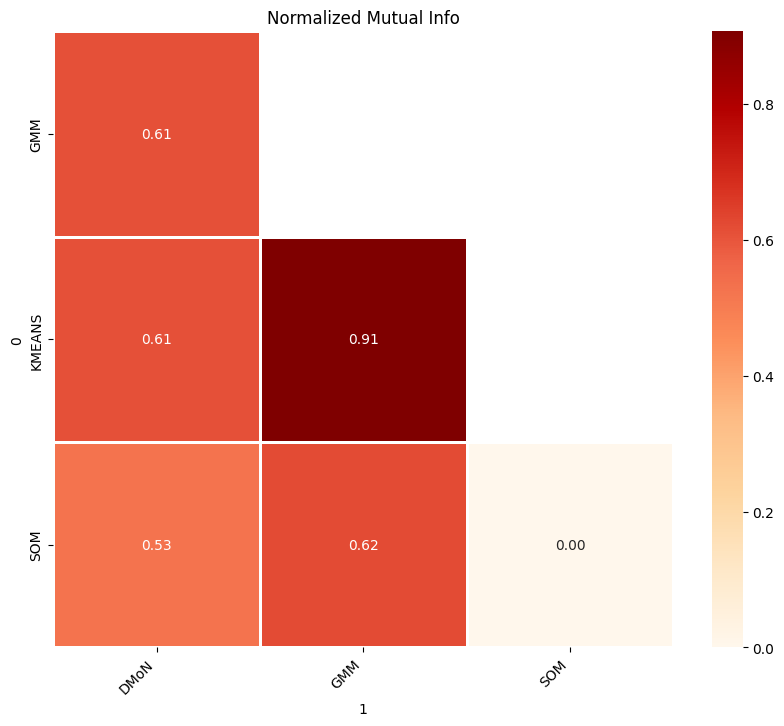

In [ ]:
ami_matr = AMI_matrix(clusterings_bd_features, plot=True)

### Evaluation Highway

Clustering

In [ ]:
DMoN_areas_to_points, DMoN_clusters = DMoN_Clustering(features_X_hig, features_position_hig, A = A, criteria = "k", r_max = 300.0, n_clusters = 5, reg = 1.0, dropout = 0.0, num_epochs = 500, learning_rate = 0.001)
GMM_areas_to_points, GMM_clusters = GMM_Clustering(features_X_hig, features_position_hig, n_clusters = 5, covariance_type = "full", tol=1e-3, reg_covar=1e-6)
SOM_areas_to_points, SOM_clusters = SOM_Clustering(features_X_hig, features_position_hig, som_shape = (3,3), sigma=0.3, learning_rate=0.3, num_iterations = 100)
Kmeans_labels = KMeans(n_clusters=5, random_state=SEED).fit_predict(h3_embeddings_highway_provnunoa_10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Visualization

In [ ]:
area_to_clusterize = "PROVNUNOA"
features_to_clusterize = "features_X_hig"
methods = ["DMoN_clusters", "GMM_clusters",  "SOM_clusters", "KMEANS_clusters"]
clusters = [DMoN_clusters, GMM_clusters,SOM_clusters, Kmeans_labels]
i = 0
for method in methods:
    gdf = features_position_hig.copy()
    gdf["clusters"] = clusters[i]
    ax.set_title(method)
    plot_map(gdf, markersize=3, figsize=(12,8))#, path=f"/content/drive/MyDrive/UC-TESIS/mapas/PROVNUNOA/{method}_{features_to_clusterize}_{area_to_clusterize}.png")
    i += 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
clusterings_hig_features = pd.DataFrame({
    "DMoN": DMoN_clusters,
    "GMM": GMM_clusters,
    "SOM": SOM_clusters,
    "KMEANS": Kmeans_labels
})
clusterings_hig_features

,DMoN,GMM,SOM,KMEANS
0,1,1,2,1
1,0,1,2,1
2,1,1,2,1
3,0,4,0,0
4,1,1,2,1
...,...,...,...,...
2527,4,0,2,4
2528,1,1,2,1
2529,1,1,2,1
2530,3,1,2,1


#### ARI

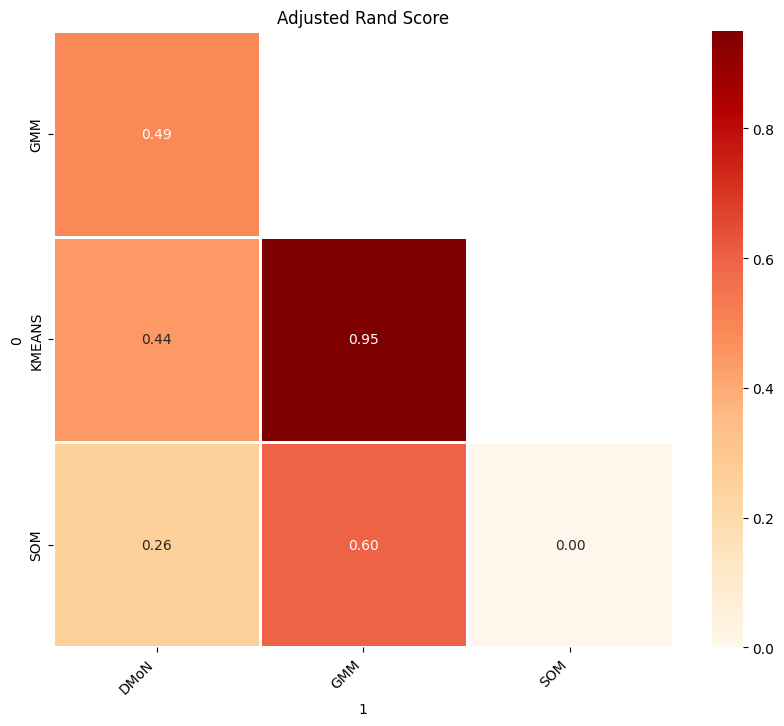

In [ ]:
ari_matr = ARI_matrix(clusterings_hig_features, plot=True)

#### AMI

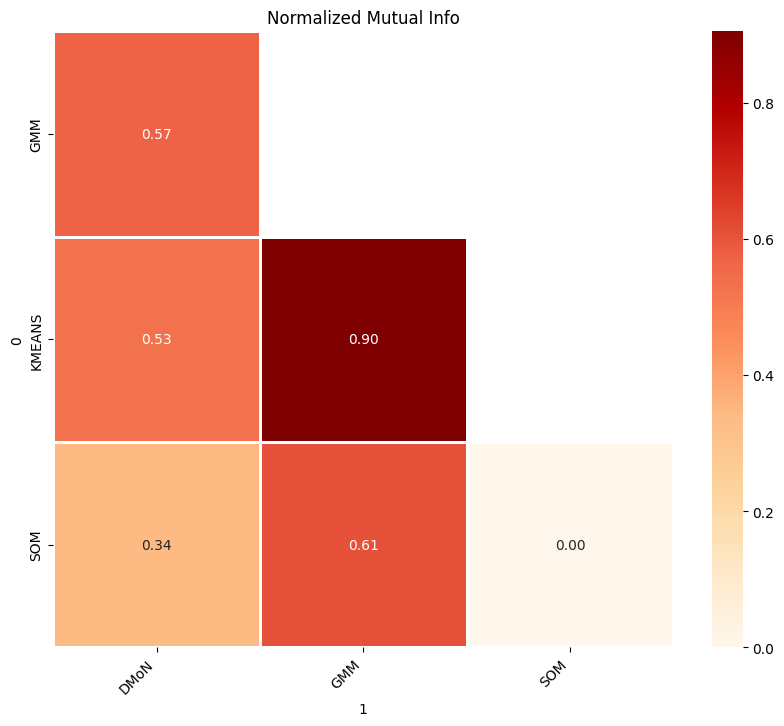

In [ ]:
ami_matr = AMI_matrix(clusterings_hig_features, plot=True)

### Evaluation landuse

Clustering

In [ ]:
DMoN_areas_to_points, DMoN_clusters = DMoN_Clustering(features_X_land, features_position_land, A = A, criteria = "k", r_max = 300.0, n_clusters = 6, reg = 1.0, dropout = 0.0, num_epochs = 500, learning_rate = 0.001)
GMM_areas_to_points, GMM_clusters = GMM_Clustering(features_X_land, features_position_land, n_clusters = 6, covariance_type = "full", tol=1e-3, reg_covar=1e-6)
SOM_areas_to_points, SOM_clusters = SOM_Clustering(features_X_land, features_position_land, som_shape = (3,3), sigma=0.3, learning_rate=0.3, num_iterations = 100)
Kmeans_labels = KMeans(n_clusters=6, random_state=SEED).fit_predict(h3_embeddings_landuse_provnunoa_10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Visualization

In [ ]:
area_to_clusterize = "PROVNUNOA"
features_to_clusterize = "features_X_land"
methods = ["DMoN_clusters", "GMM_clusters",  "SOM_clusters", "KMEANS_clusters"]
clusters = [DMoN_clusters, GMM_clusters,SOM_clusters, Kmeans_labels]
i = 0
for method in methods:
    gdf = features_position_land.copy()
    gdf["clusters"] = clusters[i]
    ax.set_title(method)
    plot_map(gdf, markersize=30, figsize=(12,8))#, path=f"/content/drive/MyDrive/UC-TESIS/mapas/PROVNUNOA/{method}_{features_to_clusterize}_{area_to_clusterize}.png")
    i += 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
clusterings_land_features = pd.DataFrame({
    "DMoN": DMoN_clusters,
    "GMM": GMM_clusters,
    "SOM": SOM_clusters,
    "KMEANS": Kmeans_labels
})
clusterings_land_features

,DMoN,GMM,SOM,KMEANS
0,0,1,2,2
1,1,0,1,0
2,5,0,1,0
3,4,5,0,1
4,2,0,1,0
...,...,...,...,...
2527,5,0,1,0
2528,4,5,0,1
2529,0,3,2,4
2530,0,1,2,2


#### ARI

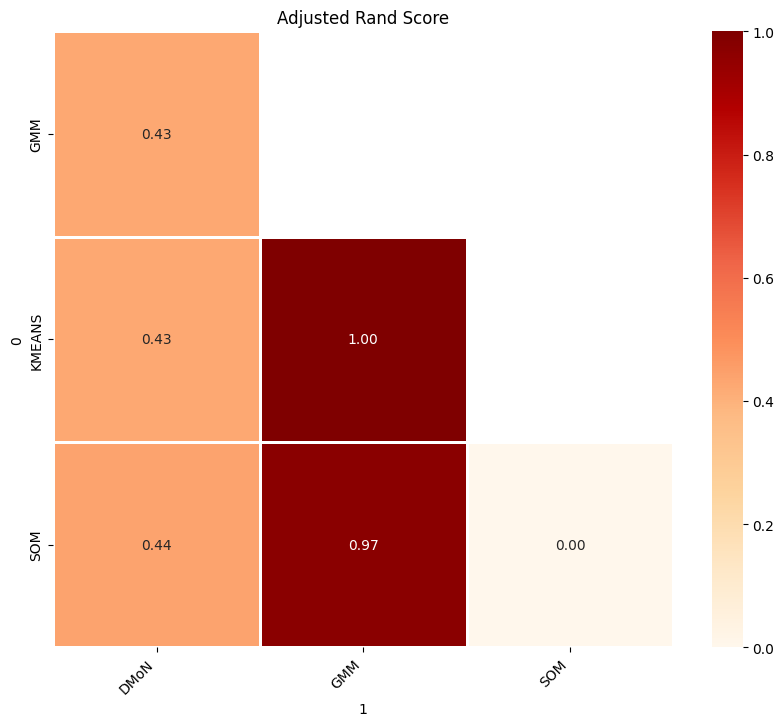

In [ ]:
ari_matr = ARI_matrix(clusterings_land_features, plot=True)

#### AMI

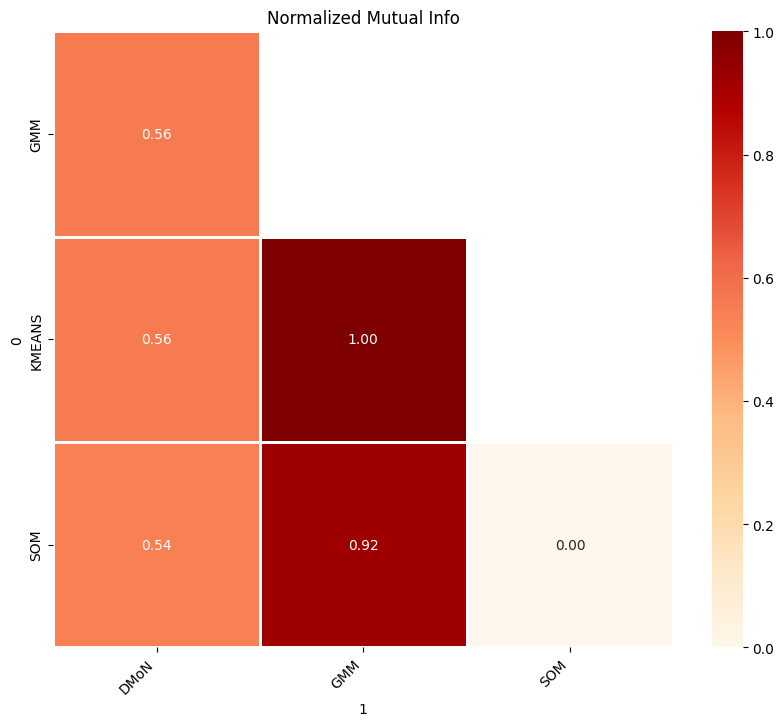

In [ ]:
ami_matr = AMI_matrix(clusterings_land_features, plot=True)

### Evaluation Natual

Clustering

In [ ]:
DMoN_areas_to_points, DMoN_clusters = DMoN_Clustering(features_X_nat, features_position_nat, A = A, criteria = "k", r_max = 300.0, n_clusters = 5, reg = 1.0, dropout = 0.0, num_epochs = 500, learning_rate = 0.001)
GMM_areas_to_points, GMM_clusters = GMM_Clustering(features_X_nat, features_position_nat, n_clusters = 5, covariance_type = "full", tol=1e-3, reg_covar=1e-6)
SOM_areas_to_points, SOM_clusters = SOM_Clustering(features_X_nat, features_position_nat, som_shape = (3,3), sigma=0.3, learning_rate=0.3, num_iterations = 100)
Kmeans_labels = KMeans(n_clusters=5, random_state=SEED).fit_predict(h3_embeddings_natural_provnunoa_10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Visualization

In [ ]:
area_to_clusterize = "PROVNUNOA"
features_to_clusterize = "features_X_ame"
methods = ["DMoN_clusters", "GMM_clusters",  "SOM_clusters", "KMEANS_clusters"]
clusters = [DMoN_clusters, GMM_clusters,SOM_clusters, Kmeans_labels]
i = 0
for method in methods:
    gdf = features_position_nat.copy()
    gdf["clusters"] = clusters[i]
    ax.set_title(method)
    plot_map(gdf, markersize=30, figsize=(12,8))#, path=f"/content/drive/MyDrive/UC-TESIS/mapas/PROVNUNOA/{method}_{features_to_clusterize}_{area_to_clusterize}.png")
    i += 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
clusterings_nat_features = pd.DataFrame({
    "DMoN": DMoN_clusters,
    "GMM": GMM_clusters,
    "SOM": SOM_clusters,
    "KMEANS": Kmeans_labels
})
clusterings_nat_features

,DMoN,GMM,SOM,KMEANS
0,2,1,0,0
1,2,1,0,0
2,4,0,1,1
3,1,0,1,1
4,4,0,1,1
...,...,...,...,...
2527,2,1,0,0
2528,2,1,0,0
2529,1,0,1,1
2530,1,0,1,1


#### ARI

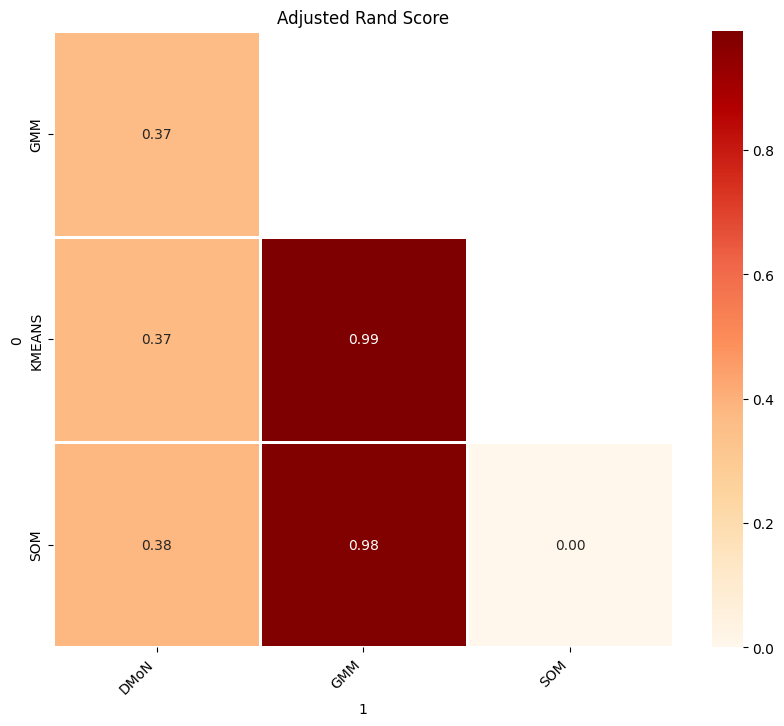

In [ ]:
ari_matr = ARI_matrix(clusterings_nat_features, plot=True)

#### AMI

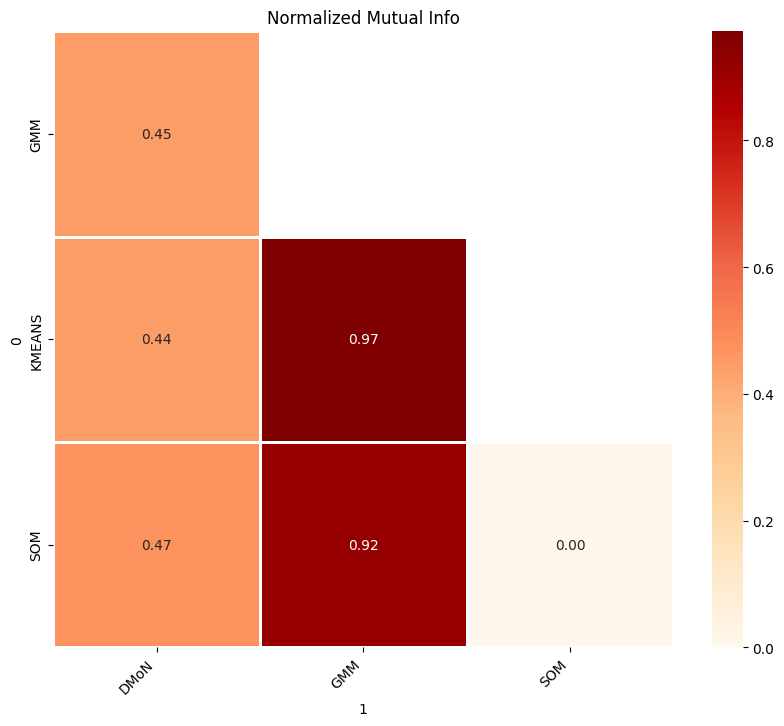

In [ ]:
ami_matr = AMI_matrix(clusterings_nat_features, plot=True)

### Evaluation Shops

Clustering

In [ ]:
DMoN_areas_to_points, DMoN_clusters = DMoN_Clustering(features_X_shp, features_position_shp, A = A, criteria = "k", r_max = 300.0, n_clusters = 5, reg = 1.0, dropout = 0.0, num_epochs = 500, learning_rate = 0.001)
GMM_areas_to_points, GMM_clusters = GMM_Clustering(features_X_shp, features_position_shp, n_clusters = 5, covariance_type = "full", tol=1e-3, reg_covar=1e-6)
SOM_areas_to_points, SOM_clusters = SOM_Clustering(features_X_shp, features_position_shp, som_shape = (3,3), sigma=0.3, learning_rate=0.3, num_iterations = 100)
Kmeans_labels = KMeans(n_clusters=5, random_state=SEED).fit_predict(h3_embeddings_shop_provnunoa_10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Visualization

In [ ]:
area_to_clusterize = "PROVNUNOA"
features_to_clusterize = "features_X_shp"
methods = ["DMoN_clusters", "GMM_clusters",  "SOM_clusters", "KMEANS_clusters"]
clusters = [DMoN_clusters, GMM_clusters,SOM_clusters, Kmeans_labels]
i = 0
for method in methods:
    gdf = features_position_shp.copy()
    gdf["clusters"] = clusters[i]
    ax.set_title(method)
    plot_map(gdf, markersize=30, figsize=(12,8))#, path=f"/content/drive/MyDrive/UC-TESIS/mapas/PROVNUNOA/{method}_{features_to_clusterize}_{area_to_clusterize}.png")
    i += 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
clusterings_shp_features = pd.DataFrame({
    "DMoN": DMoN_clusters,
    "GMM": GMM_clusters,
    "SOM": SOM_clusters,
    "KMEANS": Kmeans_labels
})
clusterings_shp_features

,DMoN,GMM,SOM,KMEANS
0,4,0,0,0
1,2,0,0,0
2,2,0,0,0
3,3,0,0,4
4,2,0,0,0
...,...,...,...,...
2527,3,0,0,4
2528,4,0,0,0
2529,4,0,0,0
2530,4,0,0,0


#### ARI

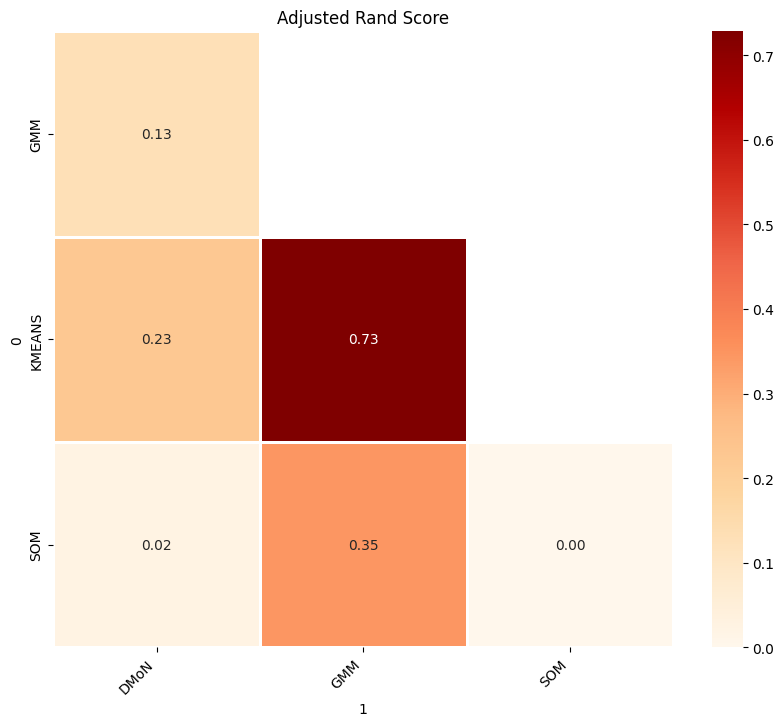

In [ ]:
ari_matr = ARI_matrix(clusterings_shp_features, plot=True)

#### AMI

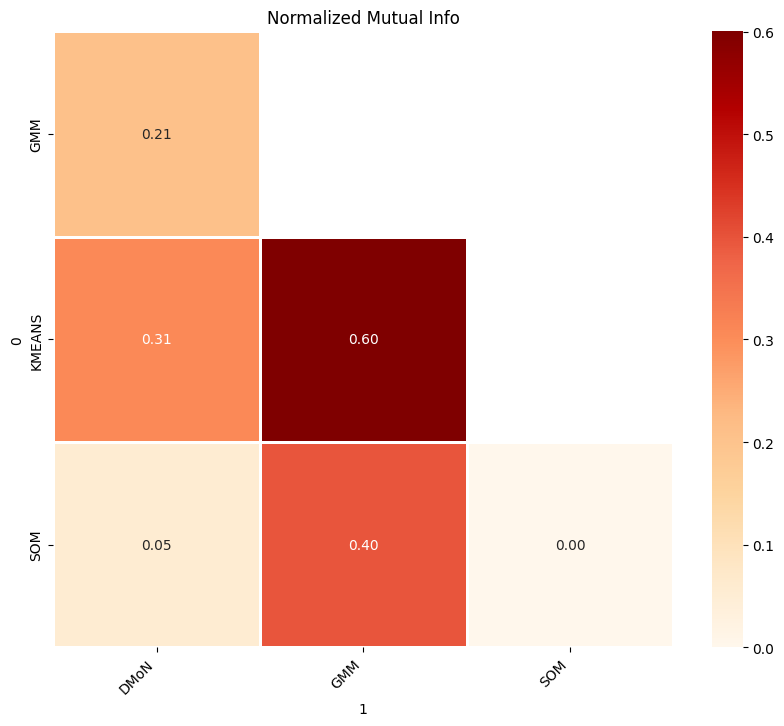

In [ ]:
ami_matr = AMI_matrix(clusterings_shp_features, plot=True)